# Machine Learning - 1st Project Phase (Evaluation Phase)

### 3) HR Analytics Project- Understanding the Attrition in HR

-- Project Description

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

-- HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

-- Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

-- Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

-- Target Variable - 'Attrition'

-- Problem Type - Classification

In [1]:
#Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [4]:
hr = pd.read_csv("C:/Users/user/Downloads/HR.csv")
pd.set_option('display.max_columns',None)
hr

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8


In [5]:
hr.shape

(1470, 35)

In [6]:
hr.head(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


In [7]:
hr.tail(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1460,29,No,Travel_Rarely,468,Research & Development,28,4,Medical,1,2054,4,Female,73,2,1,Research Scientist,1,Single,3785,8489,1,Y,No,14,3,2,80,0,5,3,1,5,4,0,4
1461,50,Yes,Travel_Rarely,410,Sales,28,3,Marketing,1,2055,4,Male,39,2,3,Sales Executive,1,Divorced,10854,16586,4,Y,Yes,13,3,2,80,1,20,3,3,3,2,2,0
1462,39,No,Travel_Rarely,722,Sales,24,1,Marketing,1,2056,2,Female,60,2,4,Sales Executive,4,Married,12031,8828,0,Y,No,11,3,1,80,1,21,2,2,20,9,9,6
1463,31,No,Non-Travel,325,Research & Development,5,3,Medical,1,2057,2,Male,74,3,2,Manufacturing Director,1,Single,9936,3787,0,Y,No,19,3,2,80,0,10,2,3,9,4,1,7
1464,26,No,Travel_Rarely,1167,Sales,5,3,Other,1,2060,4,Female,30,2,1,Sales Representative,3,Single,2966,21378,0,Y,No,18,3,4,80,0,5,2,3,4,2,0,0
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,2,Male,82,4,2,Laboratory Technician,3,Married,4404,10228,2,Y,No,12,3,1,80,0,6,3,4,4,3,1,2


In [8]:
#Checking for null values
hr.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

-- No null values present in the given dataset.

In [9]:
#Checking for Duplicates
hr.duplicated().sum()

0

-- No duplicate values too in the dataset.

In [10]:
#Checking for dataset info
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [11]:
#Checking the number of unique values of each column
hr.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [12]:
#Removing columns 'Over18','EmployeeCount' and 'StandardHours' as it has very less unique variables
hr.drop(['Over18'],axis=1,inplace=True)
hr.drop(['EmployeeCount'],axis=1,inplace=True)
hr.drop(['StandardHours'],axis=1,inplace=True)

In [14]:
cat_col = []
for i in hr.dtypes.index:
    if hr.dtypes[i] == "object":
        cat_col.append(i)
print("Categorical Variables: ",cat_col)

Categorical Variables:  ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']


In [15]:
num_col = []
for i in hr.dtypes.index:
    if hr.dtypes[i] != "object":
        num_col.append(i)
print("Numerical Variables: ",num_col)

Numerical Variables:  ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


In [16]:
#Checking unique variables in categorical columns
for i in cat_col:
    print(f"Categories in {i} variable: ",end=" ")
    print(hr[i].unique())

Categories in Attrition variable:  ['Yes' 'No']
Categories in BusinessTravel variable:  ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Categories in Department variable:  ['Sales' 'Research & Development' 'Human Resources']
Categories in EducationField variable:  ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
Categories in Gender variable:  ['Female' 'Male']
Categories in JobRole variable:  ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
Categories in MaritalStatus variable:  ['Single' 'Married' 'Divorced']
Categories in OverTime variable:  ['Yes' 'No']


## Univariate Analysis 

In [17]:
hr.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


-- Take-aways:

1) The mean age of employess in the given data is around 37 years.
2) The mean distance from home to the workplace of employess is around 9km.
3) The mean Job Satisfaction level (i.e rated from 1-5) of employees in the current company is around 2-3.
4) The avearge monthly income of employees in the current company ranges upto 6,500.
5) The average number of companies that the particular employee used to work for is around 2-3.. and the average years that the employee worked for is around 11 years..(2-3 companies in 11 years)..Therefore, the dataset consists of really experienced employees.
6) The average Performance Rating of employees given by the company is around 3 (out of 5)..which is a really good rate.
7) Average years that the employee has been working for this company is 7 years..and the average years of experience that the employee has in his current role is around 4 years..Therefore, employees are very reliable in this company and the HR's have done a really in retaining these employees for these many years..
8) There might be very light presence of outliers, as the difference between the maximum value and the third quartile is very less in these columns..

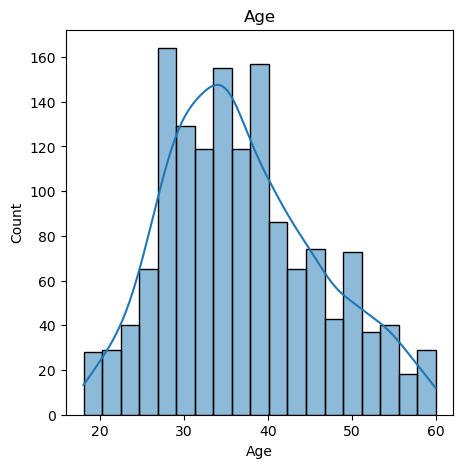

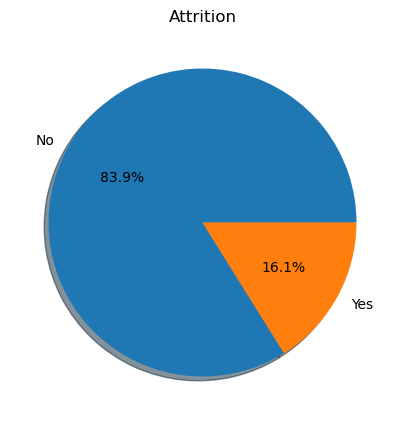

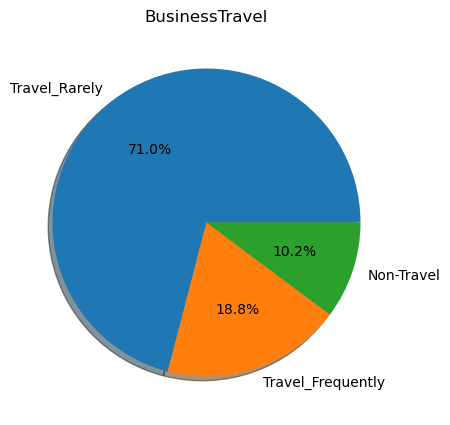

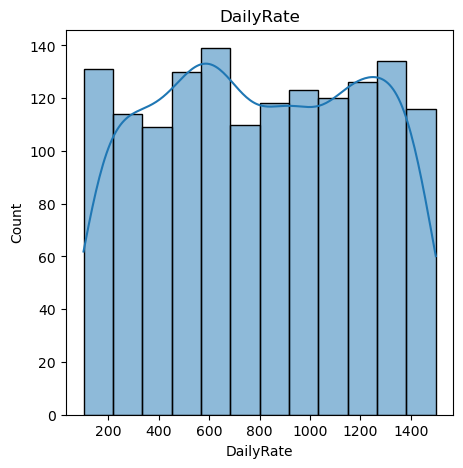

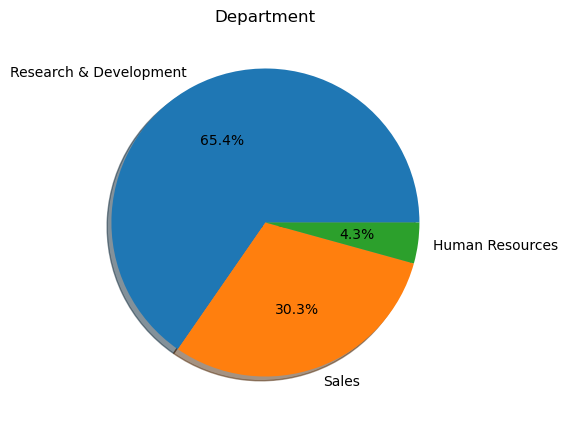

...

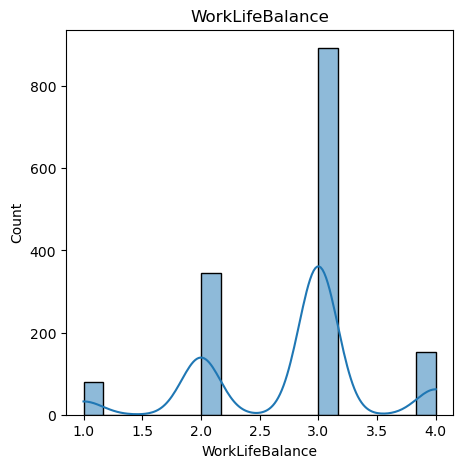

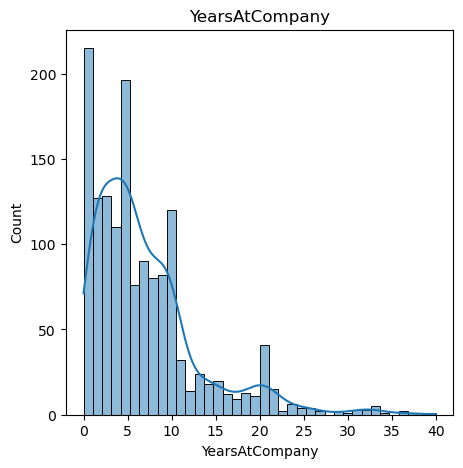

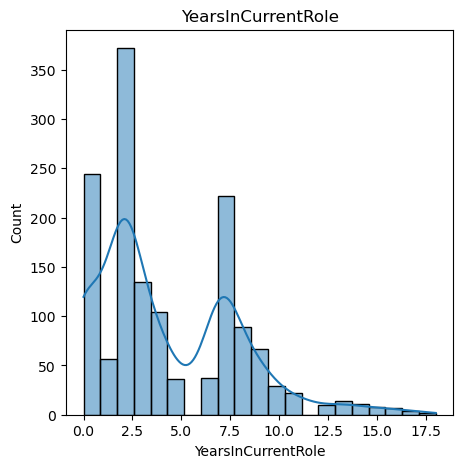

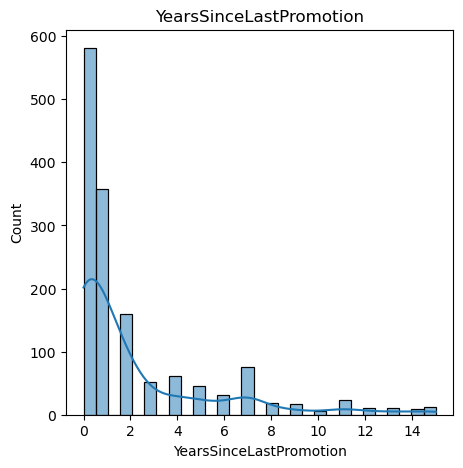

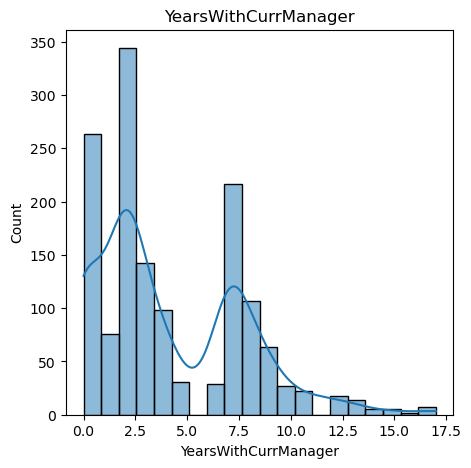

In [23]:
#Distribution of data
for column in hr:
    plt.figure(column, figsize = (5,5))
    plt.title(column)
    if hr[column].dtypes != "object":
        sns.histplot(x = column,data = hr,kde=True)
    elif hr[column].dtypes == "object":
        sizes = hr[column].value_counts()
        plt.pie(sizes.values,labels=sizes.index,autopct = '%1.1f%%',shadow=True)

-- Take-aways:

1) As we can see from the distribution of both numerical and categorical columns in the data, 
    Numerical columns = histplot
    Categorical columns = pie charts
    
2) Numerical columns have histplot as their plot for showing the distribution of data and also the skewness of data, most of the numerical columns are right skewed (i.e mean > median) almost 9 columns and the rest are either left skewed or perfectly distributed (i.e mean = median, columns like age,Daily rate) 

3) Categorical columns have pie chart as their plot for showing the distribution of data
   a) Employees classified with buisness travel as 'rarely' are much in number than non-travelling and frequent travellers.
   
   b) Employess in the department of Research & Develpoment are much higher than employees working in Sales and Human Resources.
   
   c) Percentage of employees not working overtime is way higher than those who are working overtime.
   
   d) The percentage of employees in the Sales Representative Job role in the highest in the dataset, with Research Scientist         job role coming at a close second.

## Bivariate Analysis 

-- Now we shall see how the variables(features) are related to each other and what can we derive from them. Also we shall check how the independent variables are correlated to the dependent feature.

In [32]:
numerical_features = [feature for feature in hr.columns if ((hr[feature].dtypes !='O'))]
numerical_features

['Age',
 'DailyRate',
 'DistanceFromHome',
 'Education',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

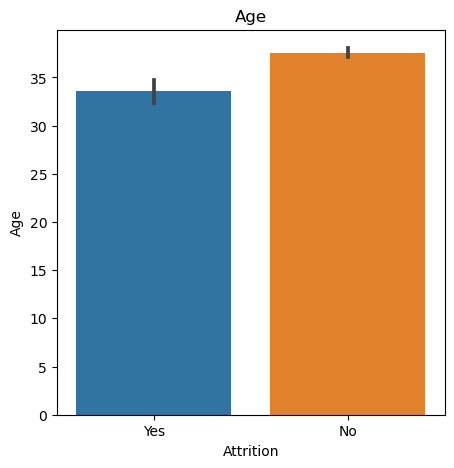

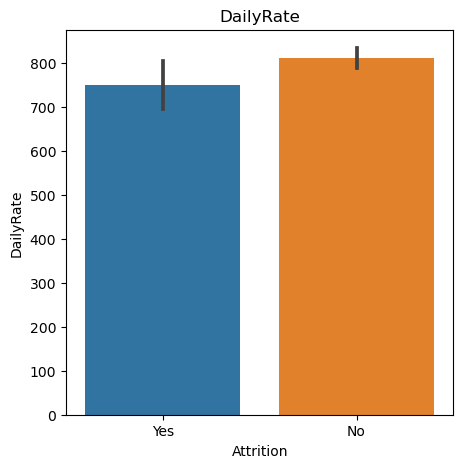

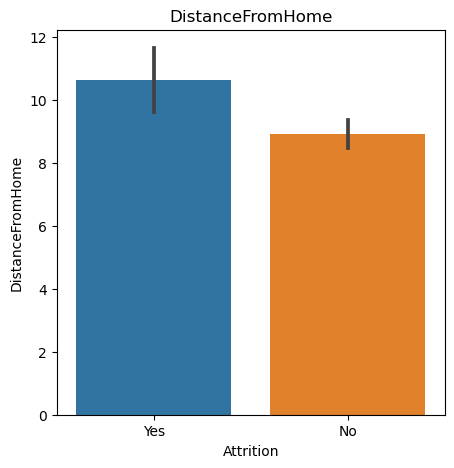

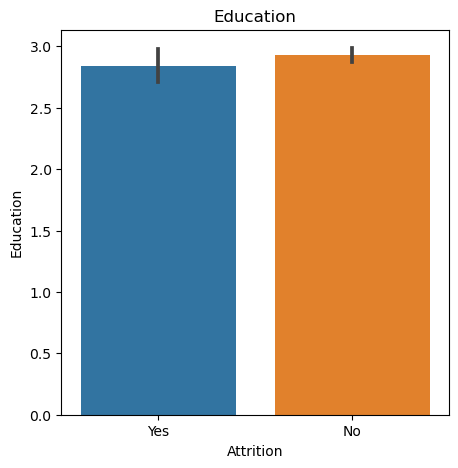

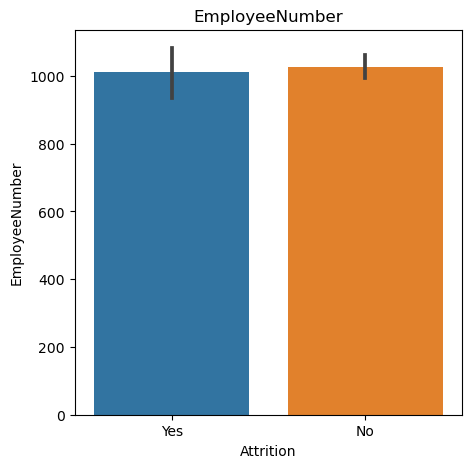

...

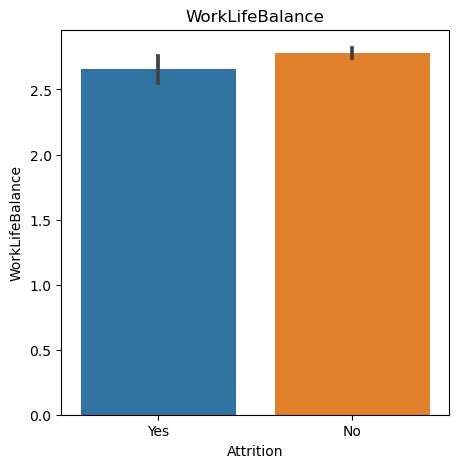

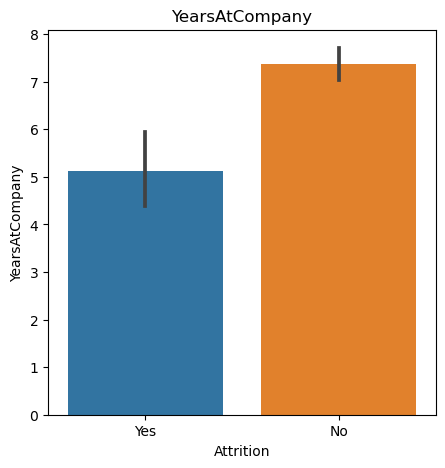

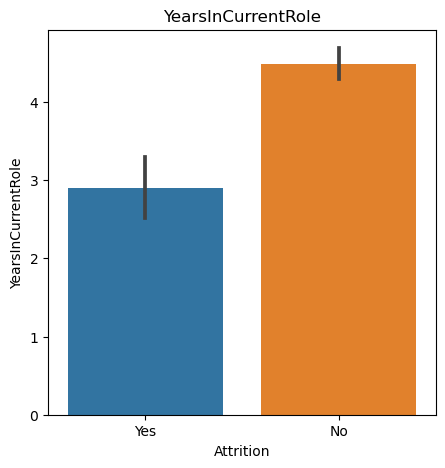

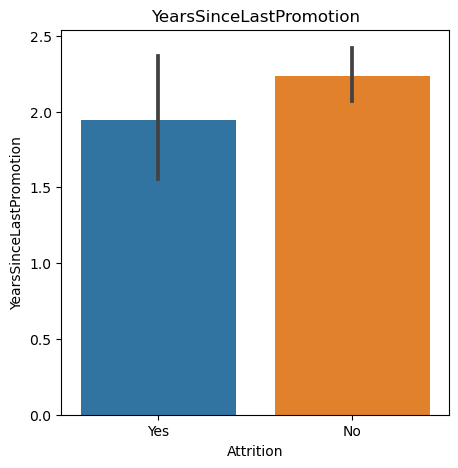

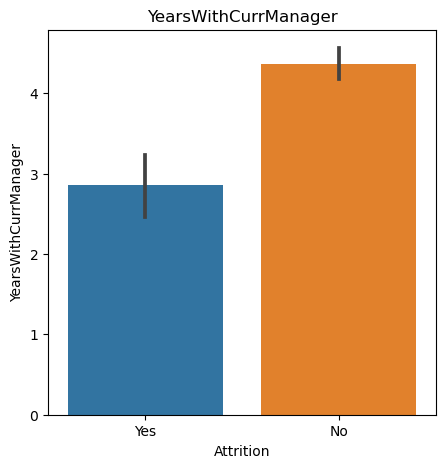

In [26]:
for column in hr:
    if hr[column].dtypes != "object":
        plt.figure(column, figsize = (5,5))
        sns.barplot(x = 'Attrition',y = column,data = hr)
        plt.title(column)

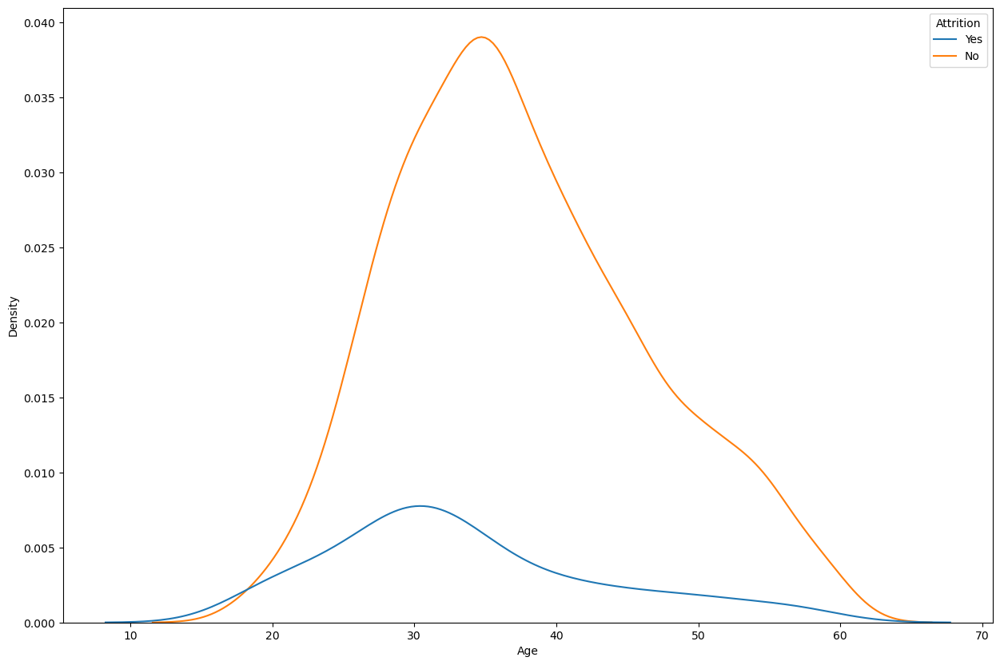

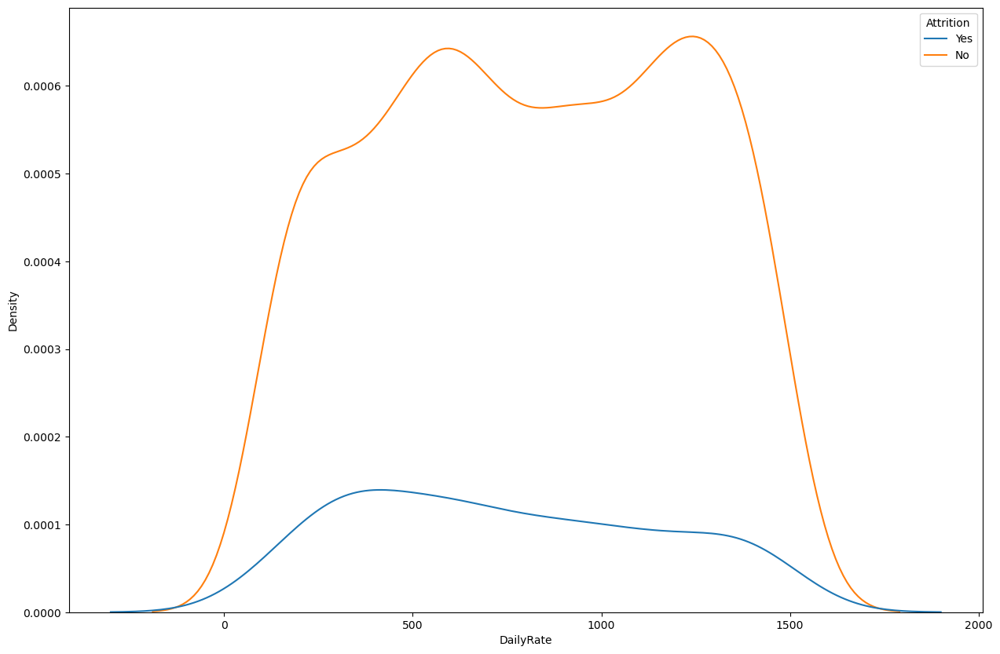

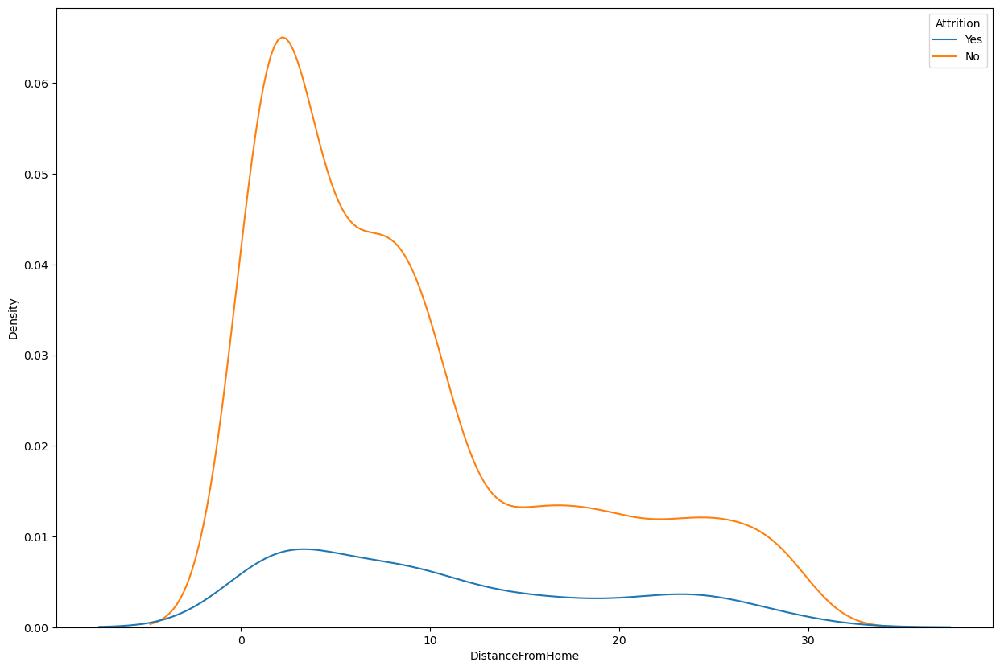

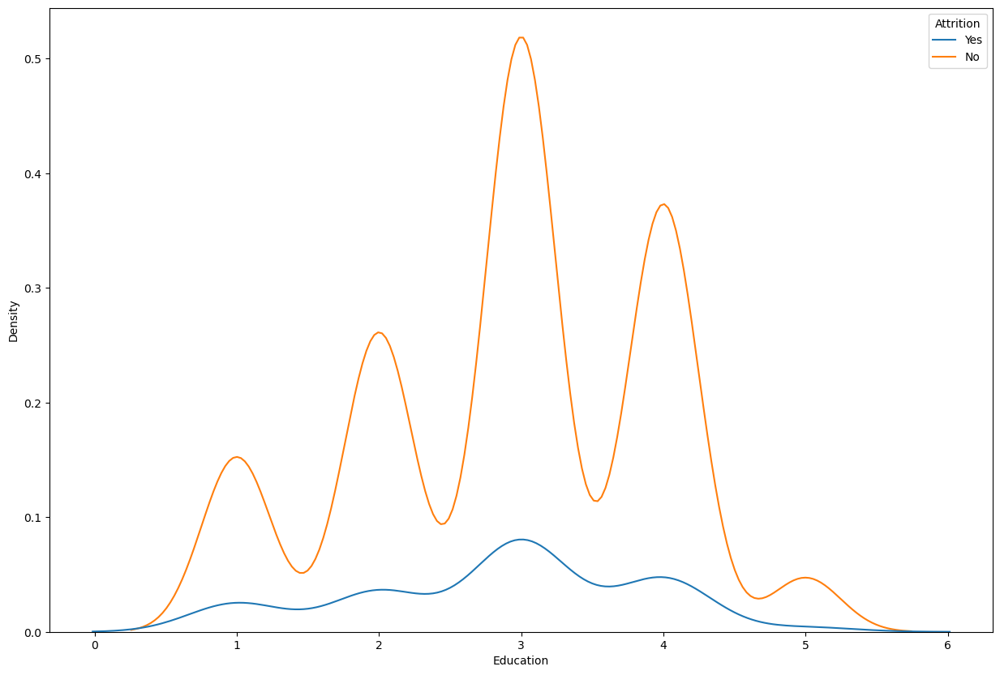

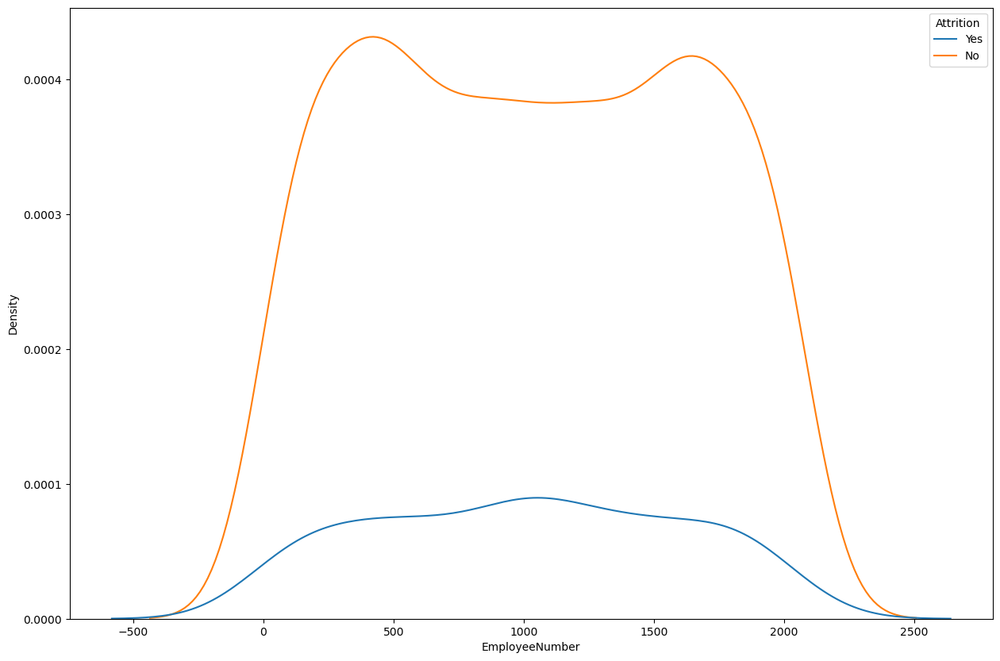

...

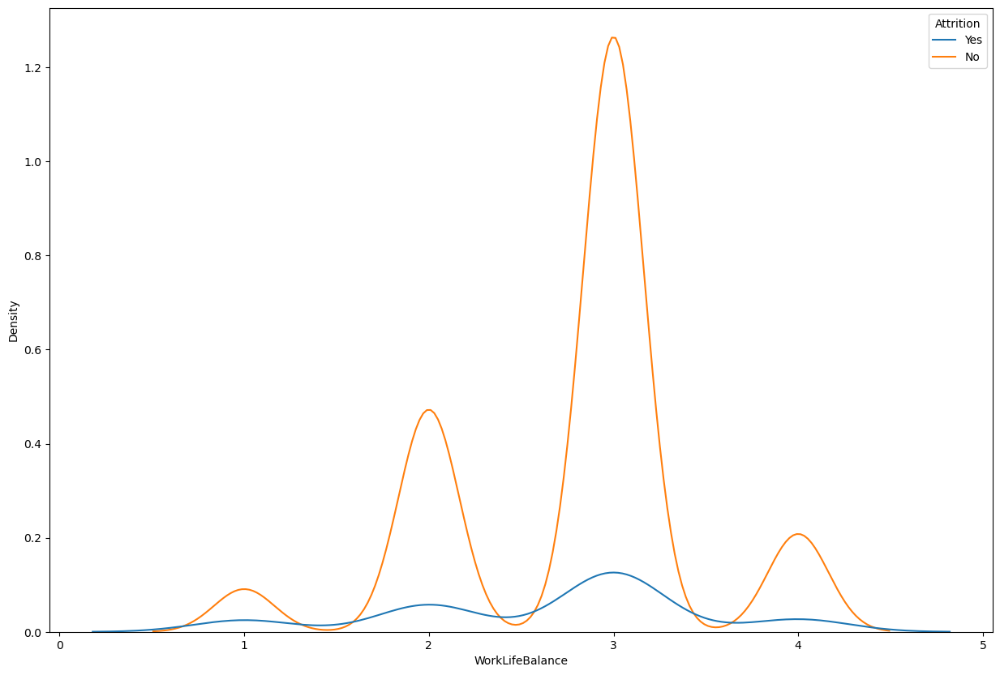

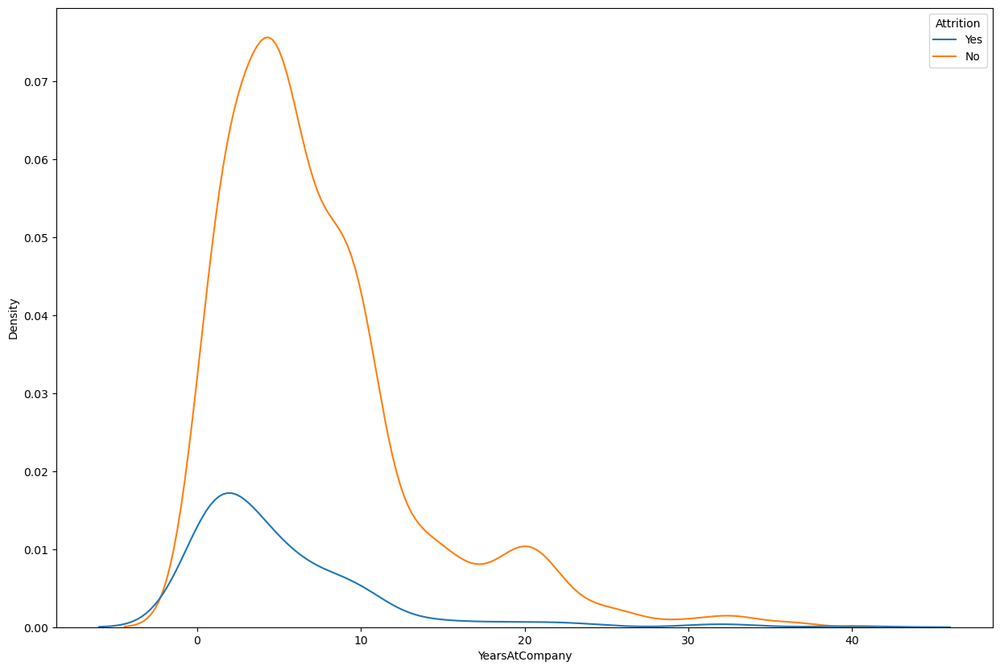

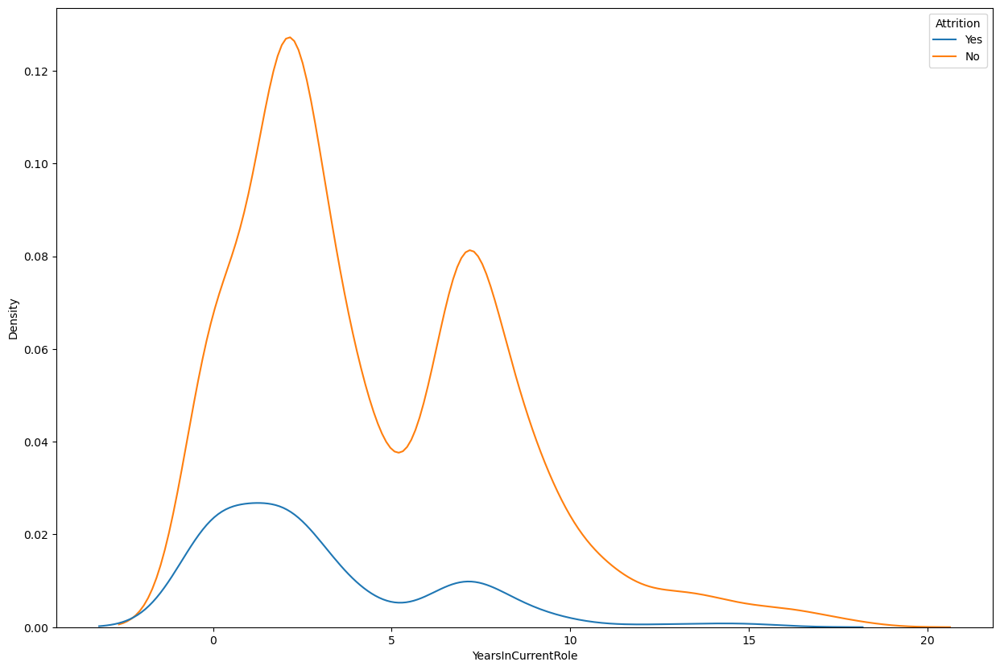

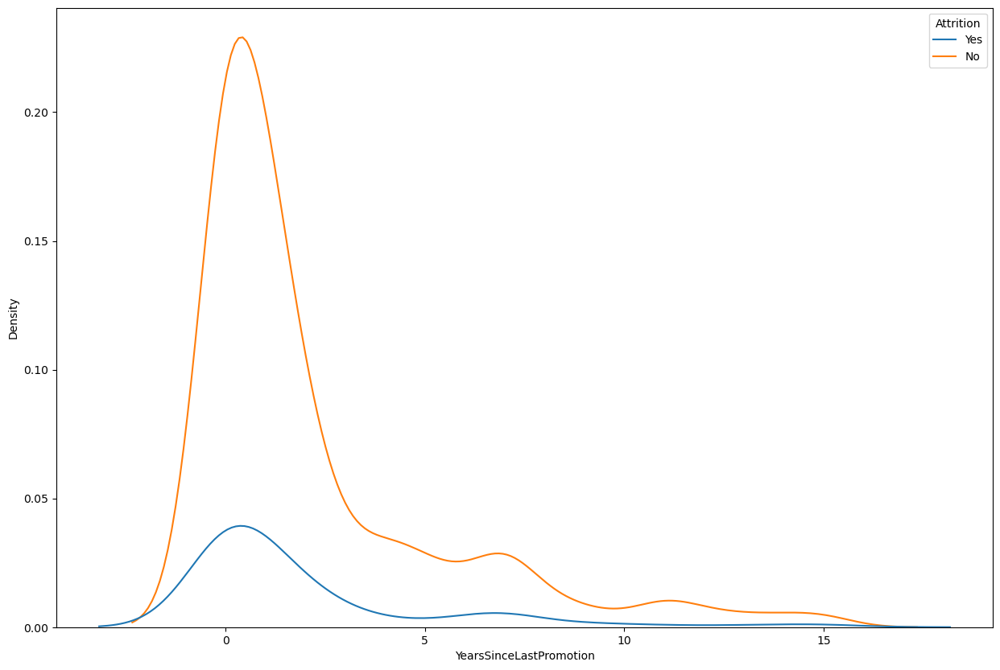

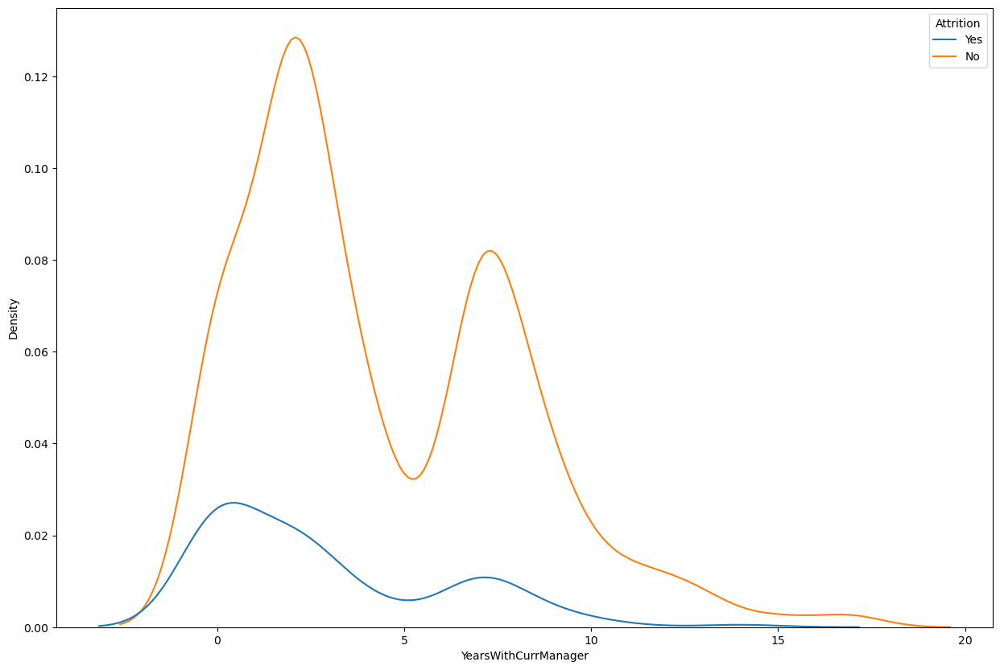

In [33]:
#Density plots for numerical features
for numerical_feature in numerical_features:
    plt.figure(figsize=(15,10))
    sns.kdeplot(x=numerical_feature,data = hr,hue='Attrition')
plt.show()

In [28]:
#Relation between Categorical features and dependent feature
categorical_features = [feature for feature in hr.columns if ((hr[feature].dtypes=='O') and (feature not in ['Attrition']))]
categorical_features

['BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'OverTime']

<Figure size 1500x3000 with 0 Axes>

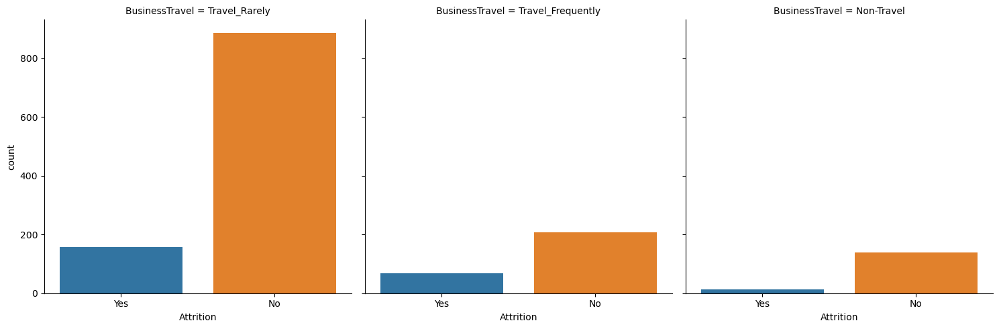

<Figure size 1500x3000 with 0 Axes>

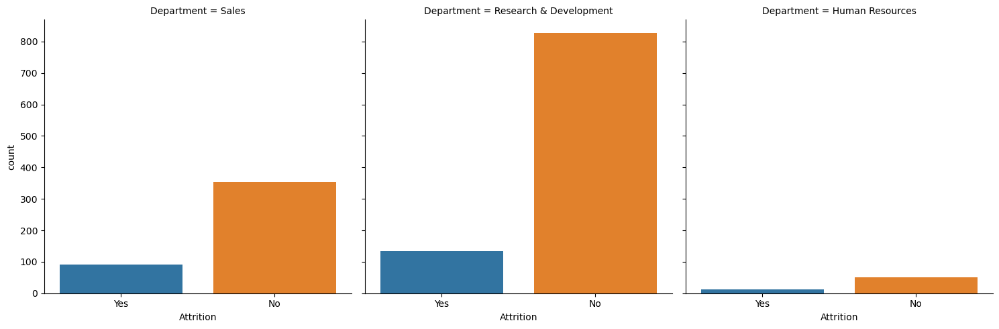

<Figure size 1500x3000 with 0 Axes>

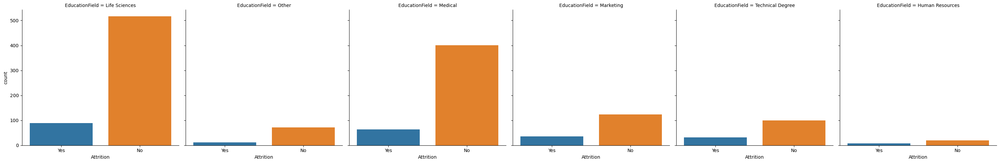

<Figure size 1500x3000 with 0 Axes>

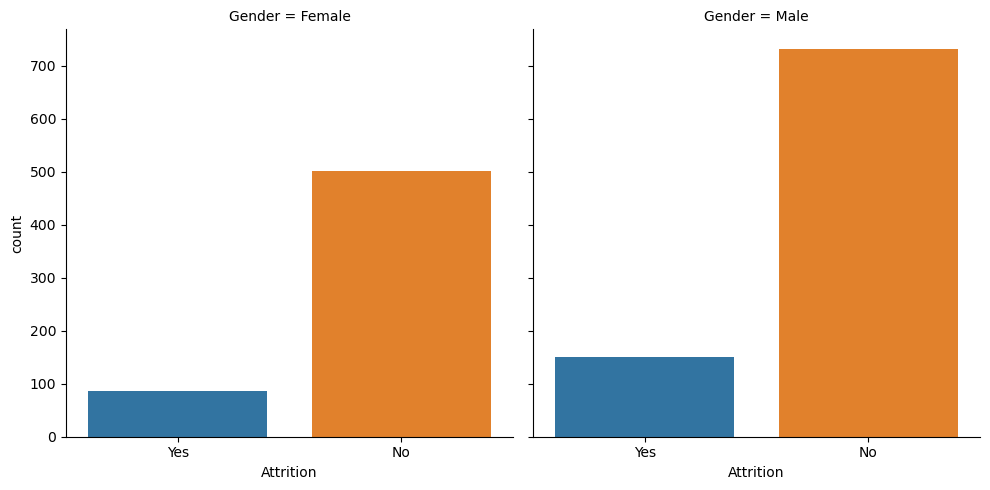

<Figure size 1500x3000 with 0 Axes>

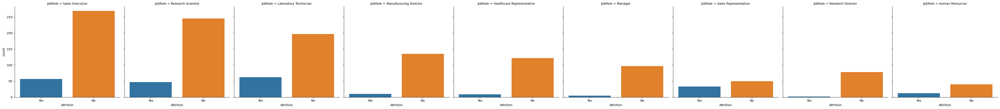

<Figure size 1500x3000 with 0 Axes>

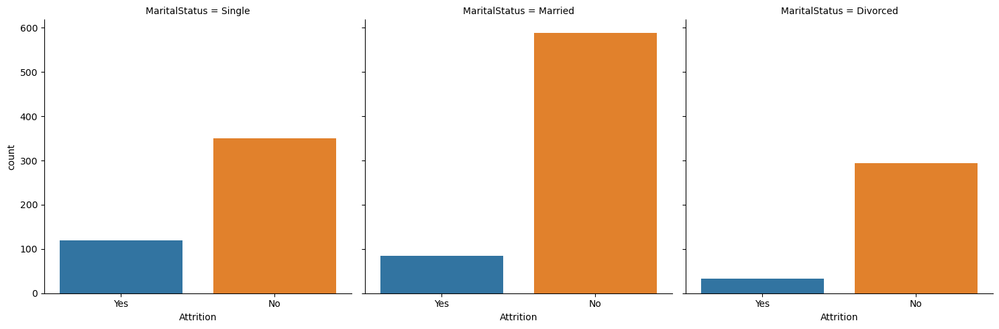

<Figure size 1500x3000 with 0 Axes>

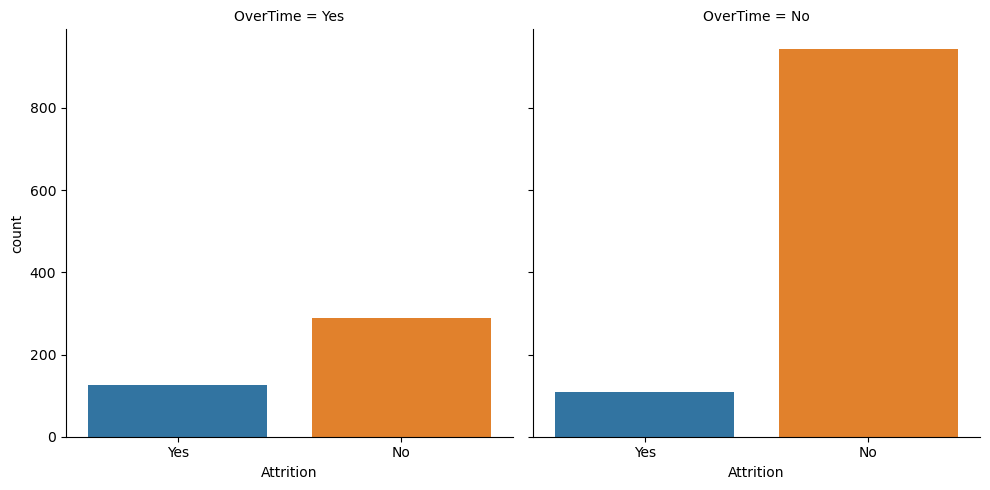

In [29]:
for categorical_feature in categorical_features:
    plt.figure(figsize=(15,30))
    sns.catplot(x='Attrition',col=categorical_feature,kind='count',data = hr)
plt.show()

In [30]:
#Now analysing seeing the numbers from the above countplots
for categorical_feature in categorical_features:
    print(hr.groupby(['Attrition',categorical_feature]).size())

Attrition  BusinessTravel   
No         Non-Travel           138
           Travel_Frequently    208
           Travel_Rarely        887
Yes        Non-Travel            12
           Travel_Frequently     69
           Travel_Rarely        156
dtype: int64
Attrition  Department            
No         Human Resources            51
           Research & Development    828
           Sales                     354
Yes        Human Resources            12
           Research & Development    133
           Sales                      92
dtype: int64
Attrition  EducationField  
No         Human Resources      20
           Life Sciences       517
           Marketing           124
           Medical             401
           Other                71
           Technical Degree    100
Yes        Human Resources       7
           Life Sciences        89
           Marketing            35
           Medical              63
           Other                11
           Technical Degree     32
d

## Multivariate Analysis 

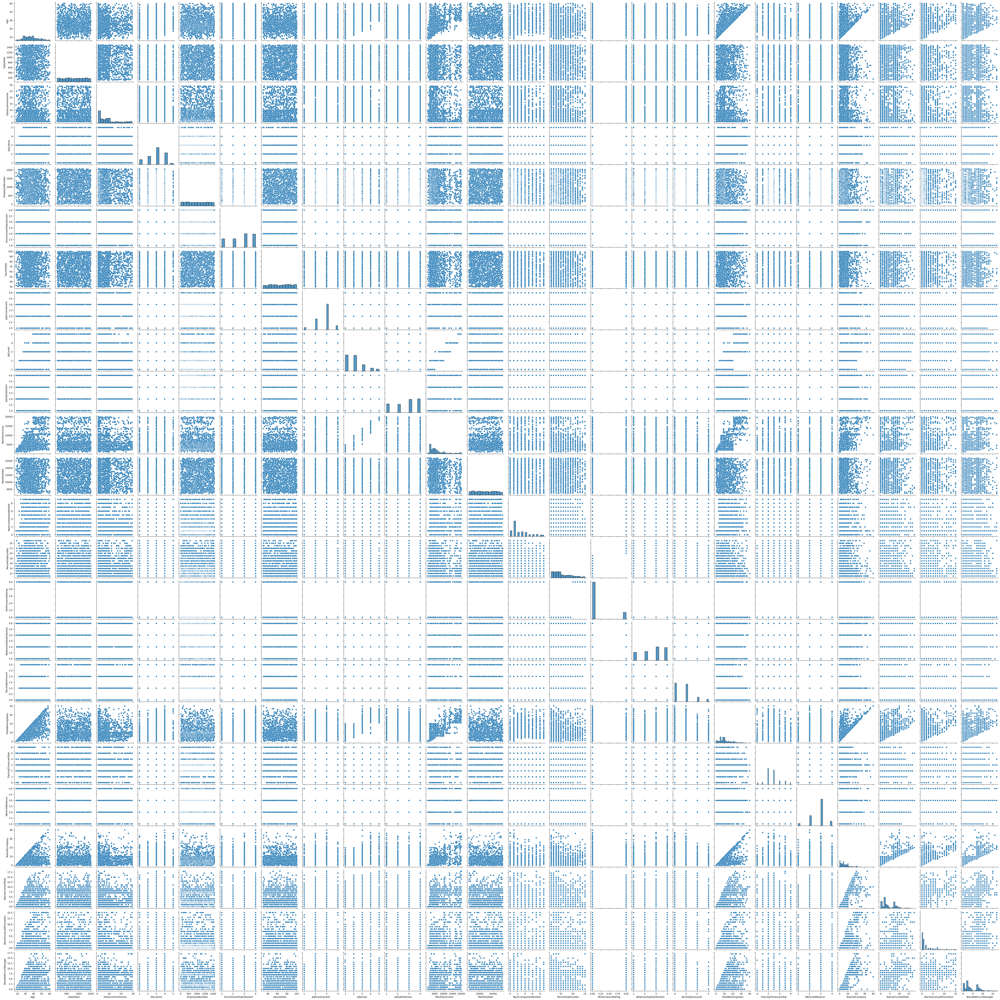

In [34]:
sns.pairplot(hr)

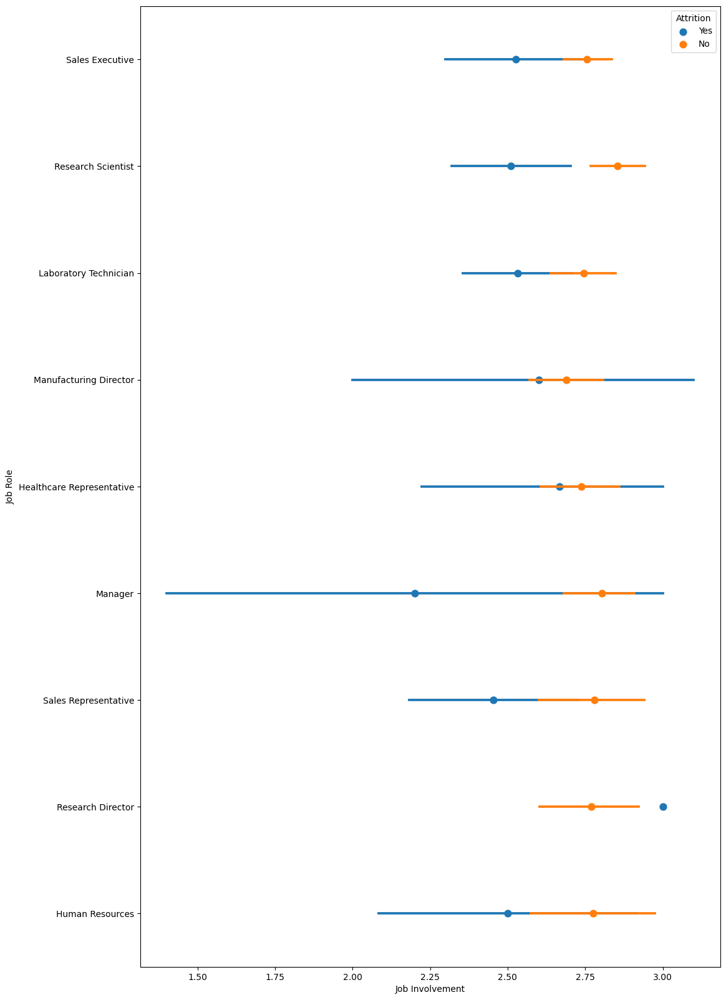

In [40]:
#Relationship between Job Involvement and Job Role distribution
plt.figure(figsize = (12,20))
sns.pointplot(x='JobInvolvement' , y='JobRole', data = hr, hue = 'Attrition',join = False)
plt.xlabel('Job Involvement')
plt.ylabel('Job Role')
plt.show()

-- Employees with more Job Involvement are less likely to leave the company (or less attrition rate), mainly Job Roles like 
Sales Executive,Research Scientist etc..

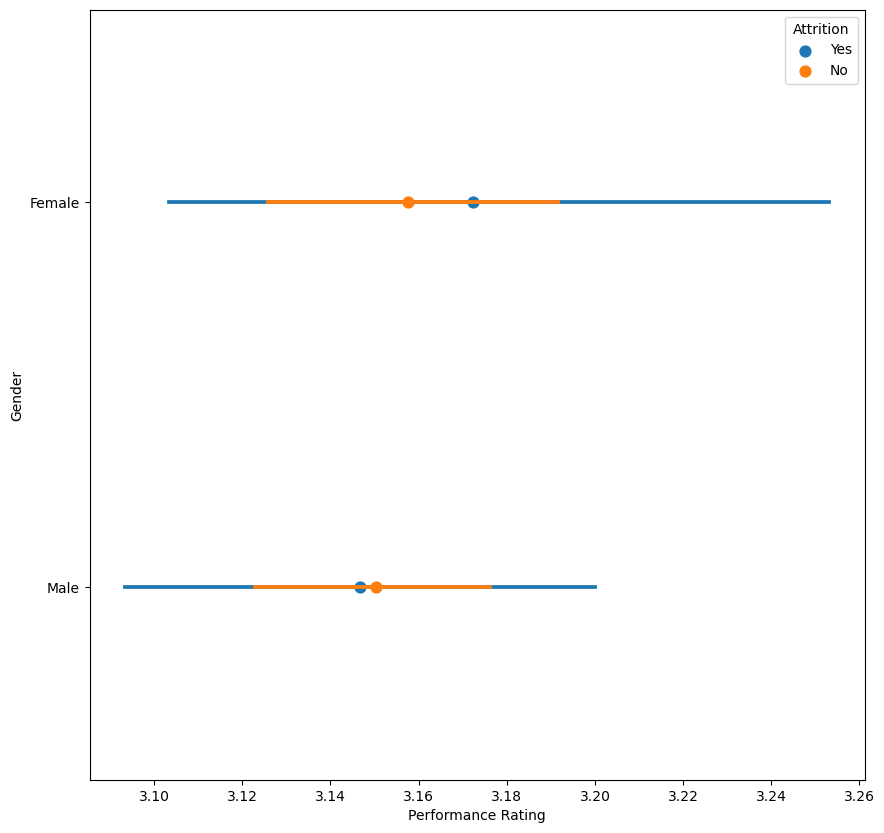

In [42]:
plt.figure(figsize = (10,10))
sns.pointplot(x='PerformanceRating' , y='Gender', data = hr, hue = 'Attrition',join = False)
plt.xlabel('Performance Rating')
plt.ylabel('Gender')
plt.show()

-- Employees with high Performance Rating are likely to leave the company, as they feel like they are doing more to the company but are either getting paid less or some other problems. Eventually, Female Employees have higher Performance Rating than Male Employees and have higher attrition than men.

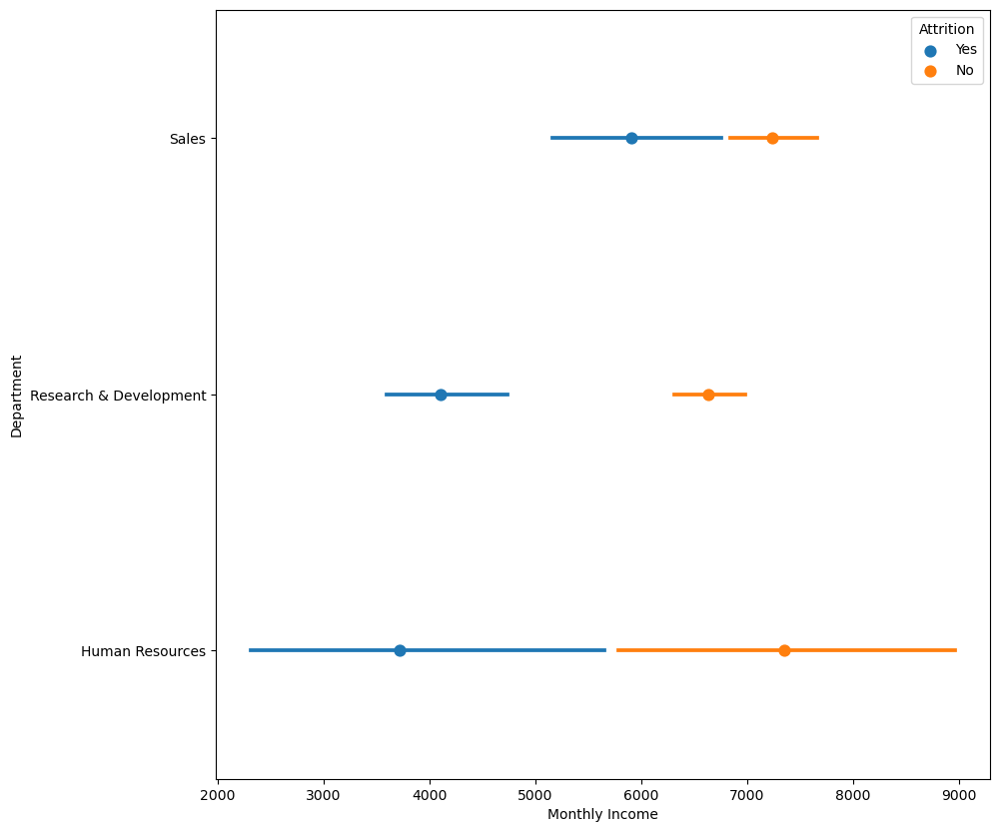

In [44]:
plt.figure(figsize = (10,10))
sns.pointplot(x='MonthlyIncome' , y='Department', data = hr, hue = 'Attrition',join = False)
plt.xlabel('Monthly Income')
plt.ylabel('Department')
plt.show()

-- Employees with high monthly Income are less likely to leave the company(less attrition rate). And the department that offers high monthly income are the Human Resources department.

## Feature Engineering and Feature Selection 

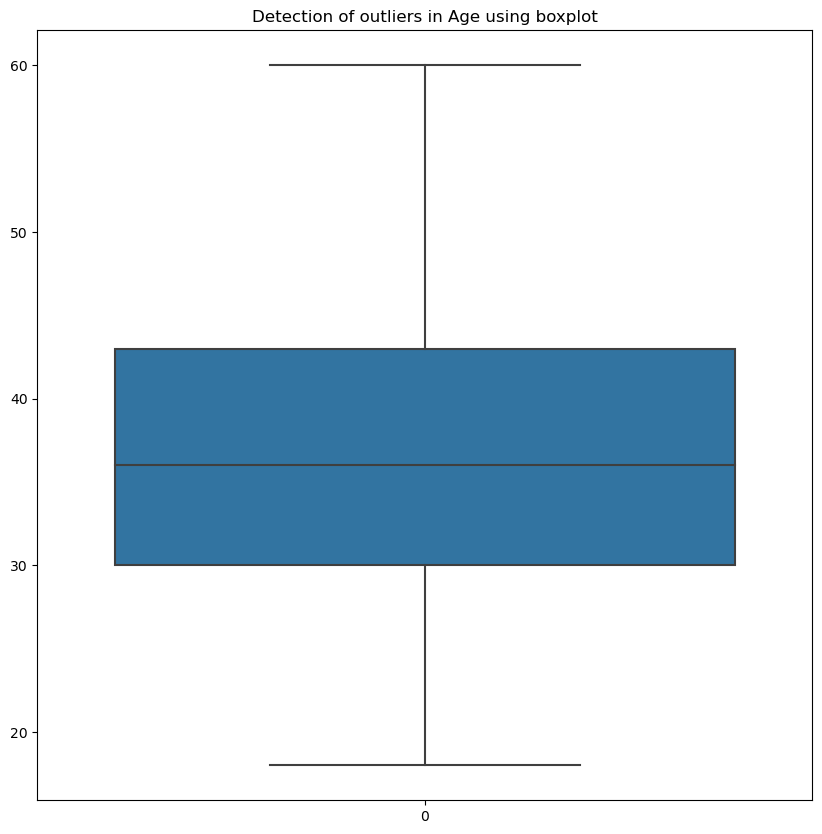

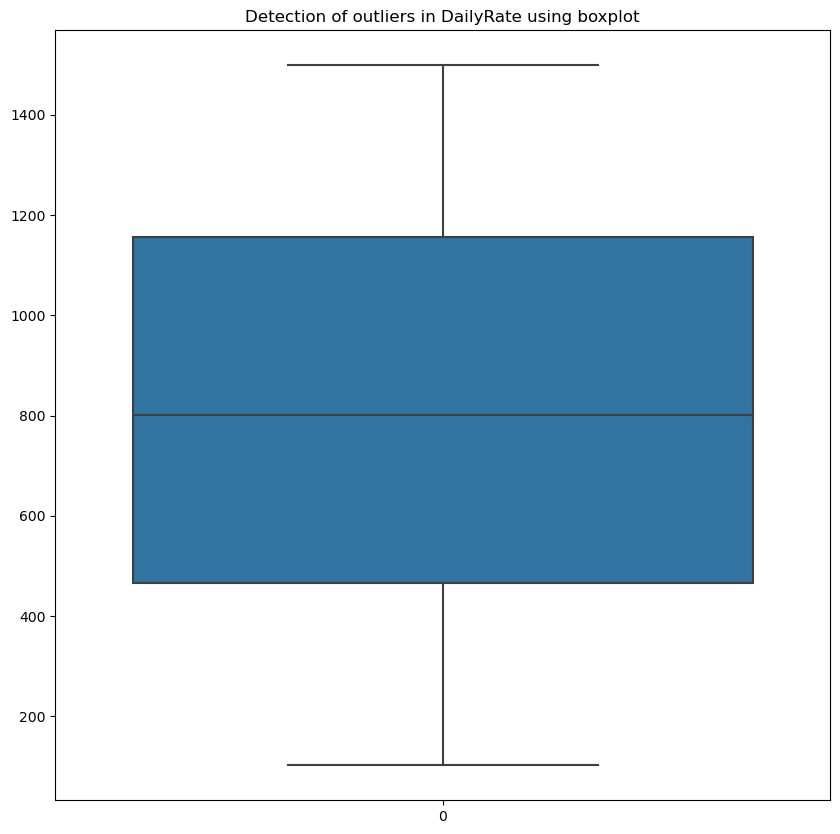

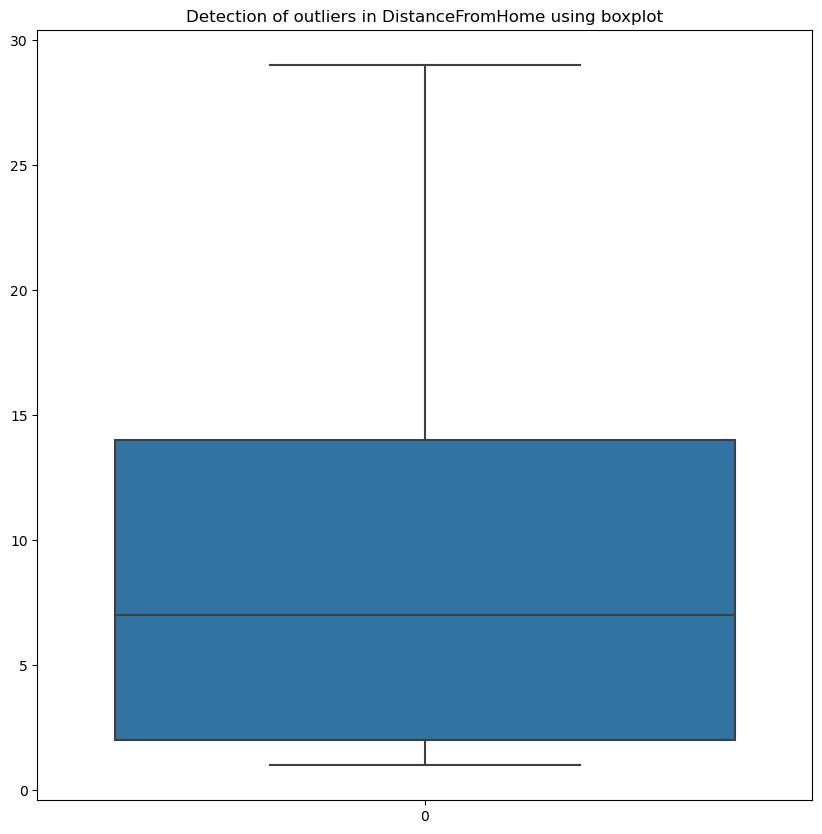

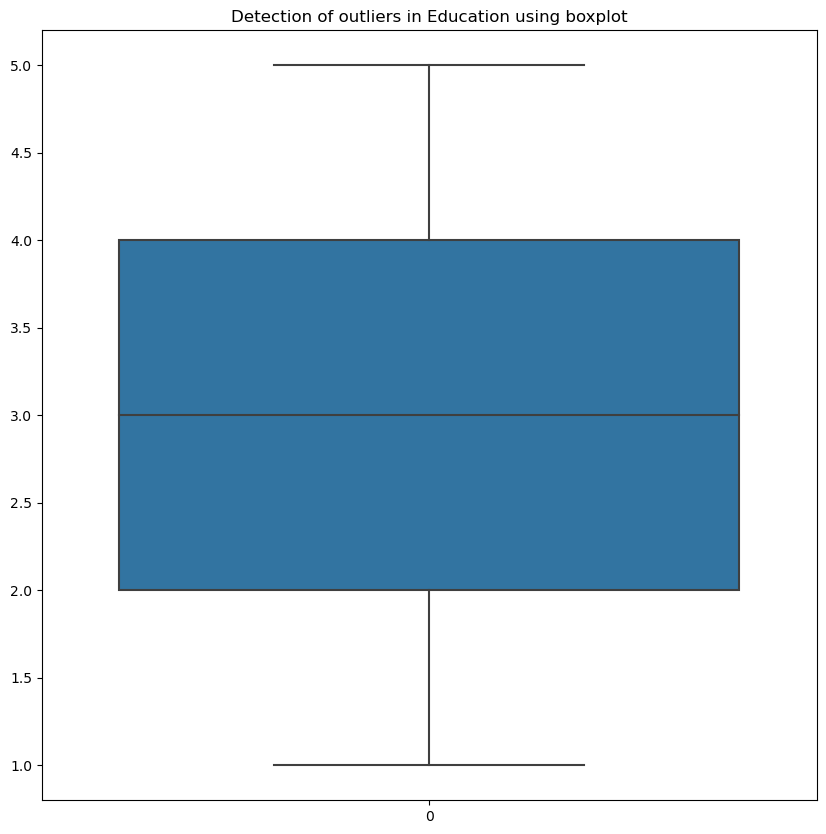

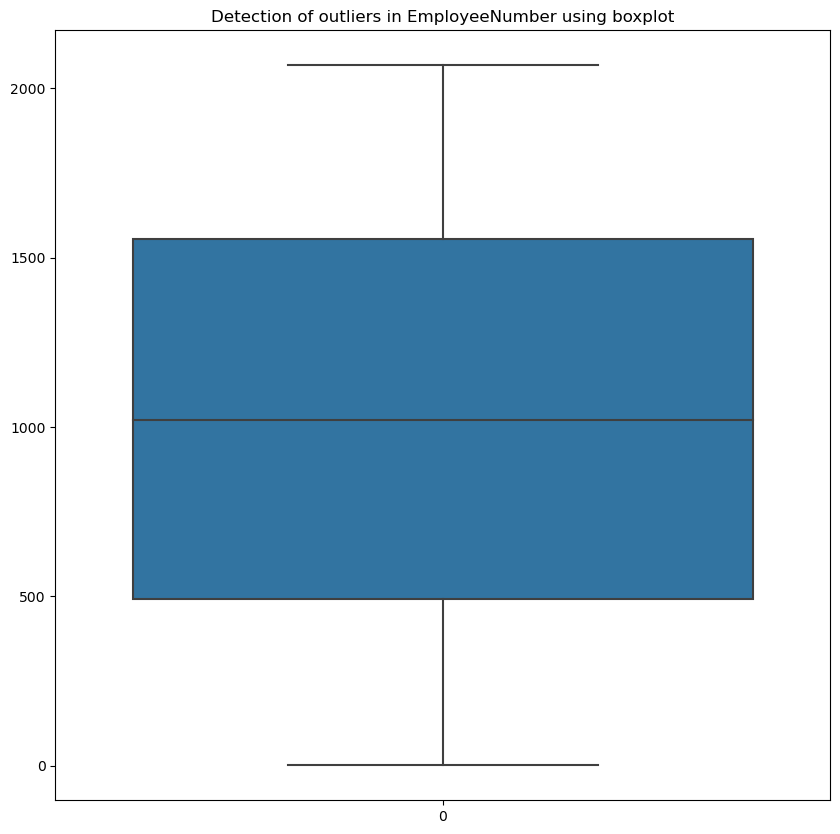

...

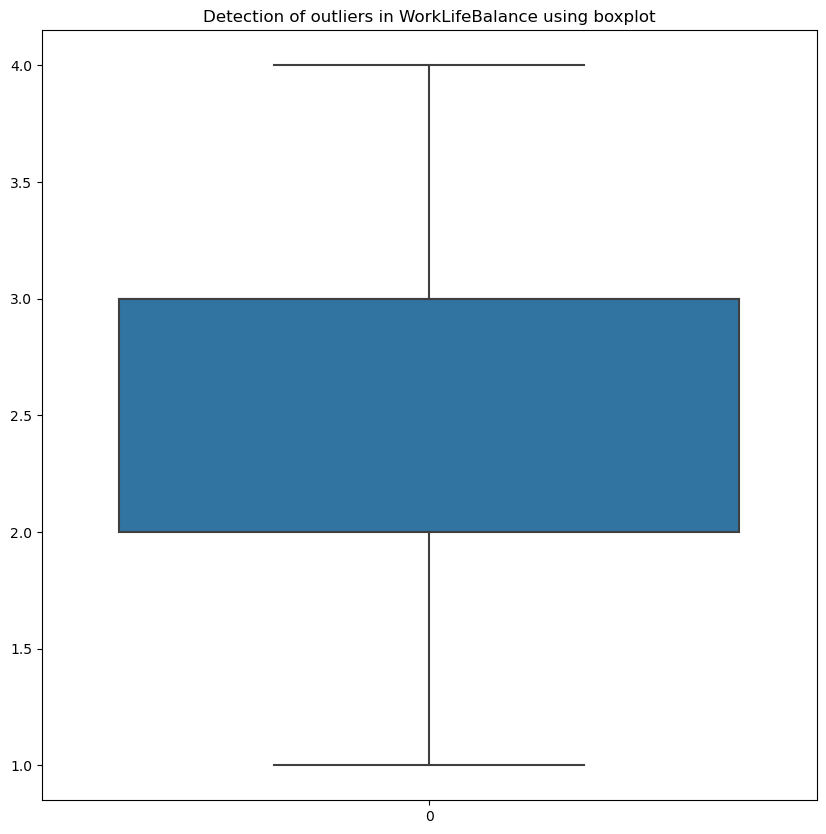

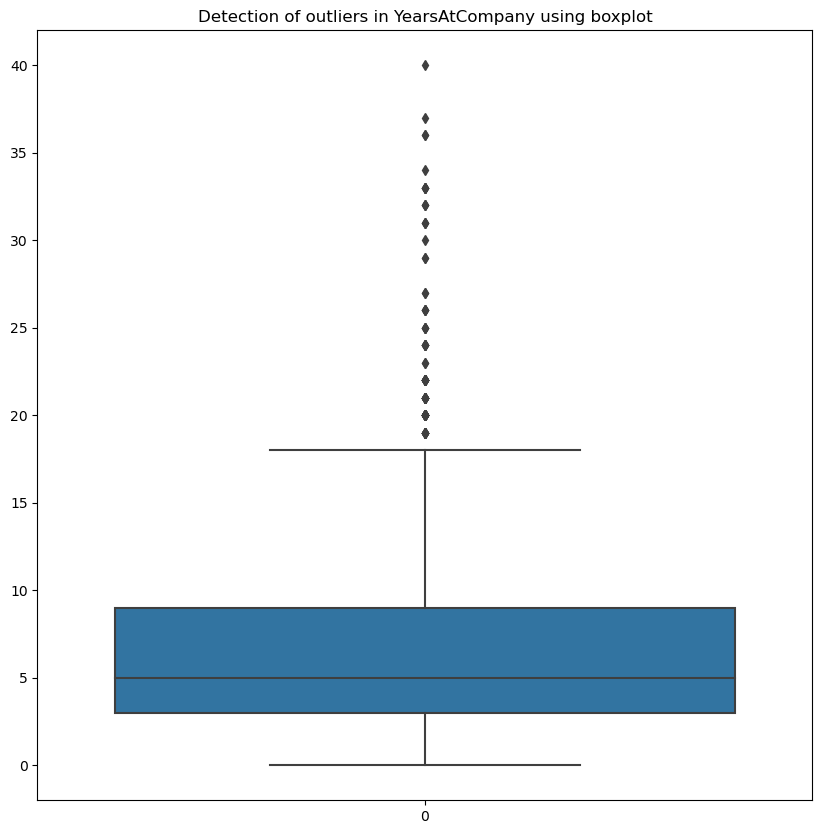

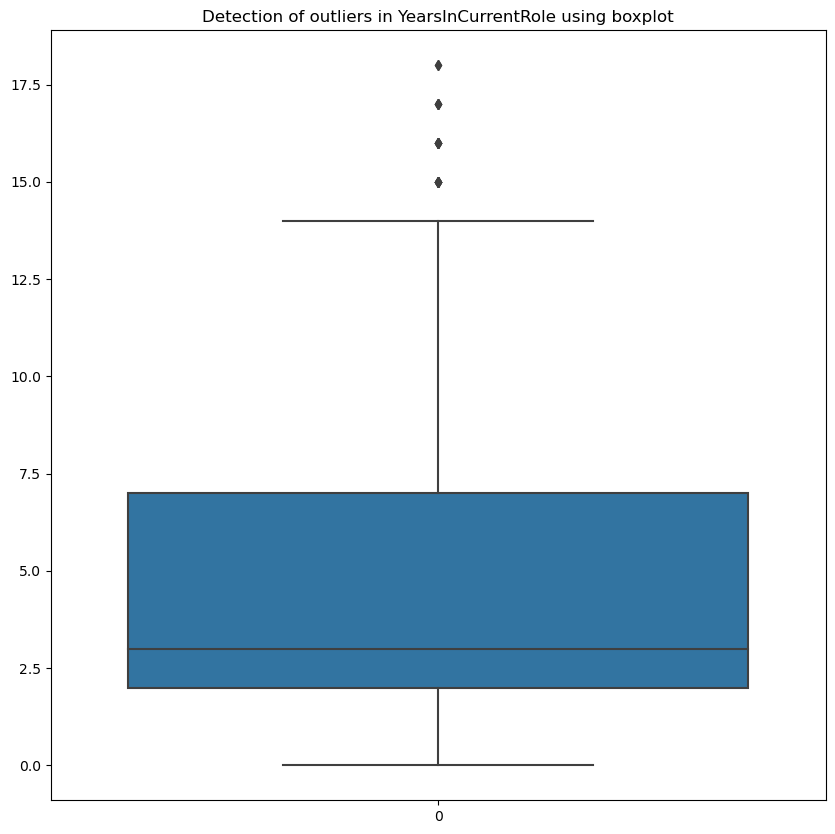

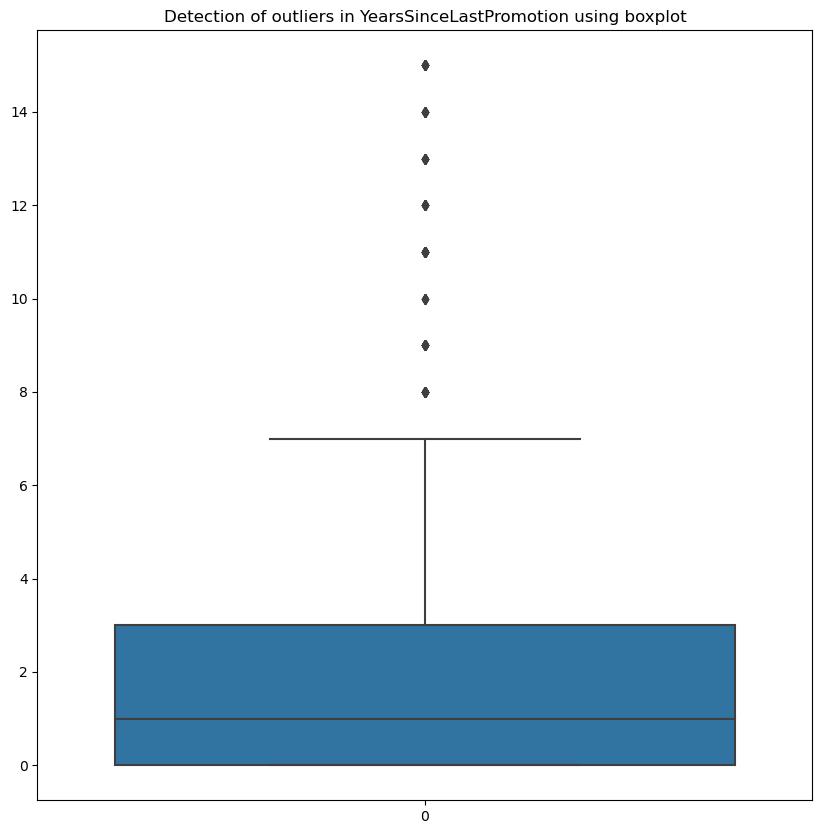

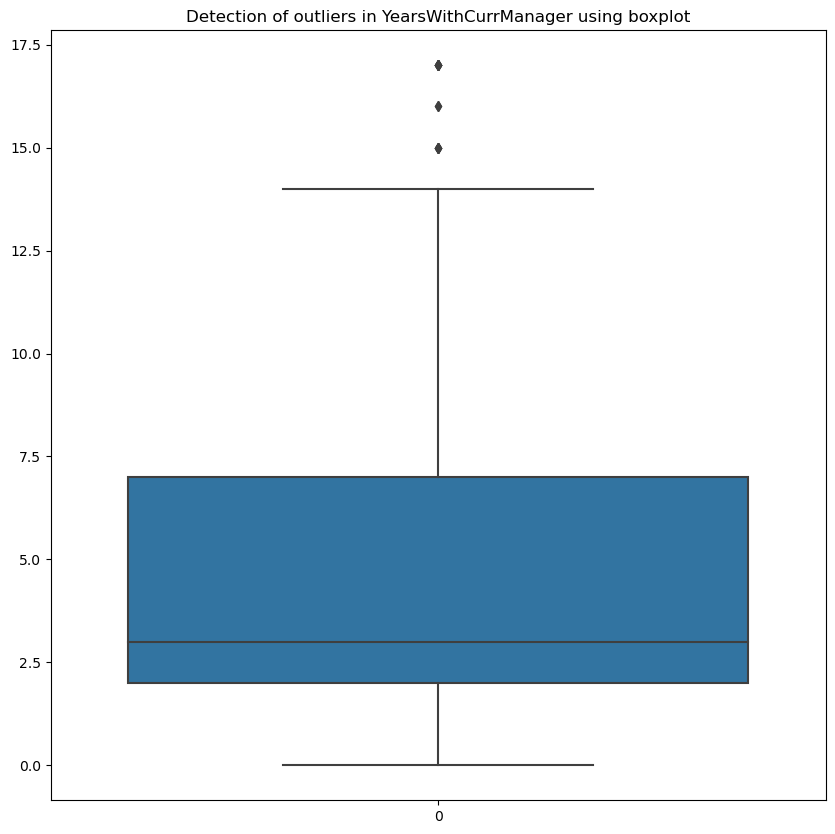

In [45]:
##Checking for outliers using boxplots and removing them if necessary
for numerical_feature in numerical_features:
    plt.figure(figsize=(10,10))
    sns.boxplot(hr[numerical_feature])
    plt.title('Detection of outliers in {} using boxplot'.format(numerical_feature))
plt.show()

In [46]:
hr.groupby(['Attrition','YearsAtCompany']).size()

Attrition  YearsAtCompany
No         0                  28
           1                 112
           2                 100
           3                 108
           4                  91
                            ... 
Yes        24                  1
           31                  1
           32                  1
           33                  1
           40                  1
Length: 64, dtype: int64

In [49]:
hr.groupby(['Attrition','YearsSinceLastPromotion']).size()

Attrition  YearsSinceLastPromotion
No         0                          471
           1                          308
           2                          132
           3                           43
           4                           56
           5                           43
           6                           26
           7                           60
           8                           18
           9                           13
           10                           5
           11                          22
           12                          10
           13                           8
           14                           8
           15                          10
Yes        0                          110
           1                           49
           2                           27
           3                            9
           4                            5
           5                            2
           6                            6

In [50]:
hr.groupby(['Attrition','YearsWithCurrManager']).size()

Attrition  YearsWithCurrManager
No         0                       178
           1                        65
           2                       294
           3                       123
           4                        87
           5                        27
           6                        25
           7                       185
           8                        97
           9                        58
           10                       24
           11                       21
           12                       18
           13                       14
           14                        3
           15                        5
           16                        2
           17                        7
Yes        0                        85
           1                        11
           2                        50
           3                        19
           4                        11
           5                         4
           6                    

-- We will be removing outliers in the following columns as some data entries does not look realistic :

1) 'Years at Company'
2) 'Years Since Last Promotion'
3) 'Years with current manager'

In [53]:
from scipy.stats import zscore
z_scores_column1 = zscore(hr['YearsSinceLastPromotion'])
z_scores_column2 = zscore(hr['YearsAtCompany'])
z_scores_column3 = zscore(hr['YearsWithCurrManager'])
threshold=3
outliers = (abs(z_scores_column1)<threshold) & (abs(z_scores_column2)<threshold) & (abs(z_scores_column3)<threshold)
hr_1 = hr[outliers]

In [54]:
hr_1

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,No,17,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,No,15,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Yes,20,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,No,14,3,4,0,17,3,2,9,6,0,8


-- Outliers removed successfully..

In [55]:
#Removing the 'Employee Number' feature as the feature does not make a difference in the prediction process
hr_1.drop(['EmployeeNumber'],axis=1,inplace=True)

In [56]:
hr_1

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,No,17,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,No,15,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Yes,20,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,No,14,3,4,0,17,3,2,9,6,0,8


-- Correlation Analysis

In [57]:
#Correlation among numerical columns
hr_cor = hr_1.corr()
hr_cor

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.018622,-0.005150,0.202461,0.010219,0.034959,0.042066,0.469786,0.007238,0.459076,0.028761,0.315841,0.008099,0.001543,0.037114,0.051631,0.650752,-0.021509,-0.017261,0.193117,0.146060,0.118970,0.135251
DailyRate,0.018622,1.000000,-0.009756,-0.016640,0.028693,0.011878,0.048101,0.012531,0.037265,0.019609,-0.032707,0.034278,0.022937,-0.001153,0.012733,0.044646,0.035759,0.007201,-0.048282,-0.009660,0.014399,-0.044005,-0.015798
DistanceFromHome,-0.005150,-0.009756,1.000000,0.006370,-0.020087,0.030322,0.011580,0.012232,-0.009939,-0.010030,0.032103,-0.026434,0.036596,0.025507,0.008775,0.048049,0.005090,-0.033476,-0.034907,0.013738,0.020514,0.004722,0.000425
Education,0.202461,-0.016640,0.006370,1.000000,-0.027432,0.015851,0.047568,0.091349,-0.012350,0.083850,-0.022368,0.134270,-0.009618,-0.024020,-0.004521,0.027173,0.133900,-0.026692,0.009891,0.034399,0.060305,0.047520,0.034028
EnvironmentSatisfaction,0.010219,0.028693,-0.020087,-0.027432,1.000000,-0.045080,-0.012185,0.006569,-0.006901,-0.004111,0.034948,0.013975,-0.035301,-0.029948,0.010204,0.009893,-0.008510,-0.021040,0.026319,-0.008104,0.017321,0.021935,-0.005573
HourlyRate,0.034959,0.011878,0.030322,0.015851,-0.045080,1.000000,0.048838,-0.023978,-0.070876,-0.012446,-0.013630,0.025895,-0.009259,-0.002513,0.004692,0.041062,0.007939,-0.015115,-0.007796,-0.015070,-0.016655,-0.036261,-0.010187
JobInvolvement,0.042066,0.048101,0.011580,0.047568,-0.012185,0.048838,1.000000,0.001765,-0.005836,-0.002610,-0.004538,0.015841,-0.017004,-0.029497,0.041464,0.023409,0.010524,-0.013748,-0.006919,0.004275,0.016139,-0.004289,0.030870
JobLevel,0.469786,0.012531,0.012232,0.091349,0.006569,-0.023978,0.001765,1.000000,0.008707,0.942961,0.040407,0.161921,-0.021836,-0.016852,0.003737,0.022067,0.758397,-0.023025,0.050432,0.434084,0.327472,0.229310,0.317921
JobSatisfaction,0.007238,0.037265,-0.009939,-0.012350,-0.006901,-0.070876,-0.005836,0.008707,1.000000,0.006901,-0.002173,-0.054927,0.019430,0.004342,-0.015072,0.007022,-0.002770,-0.008813,-0.021576,0.023315,0.011834,0.007214,-0.001571
MonthlyIncome,0.459076,0.019609,-0.010030,0.083850,-0.004111,-0.012446,-0.002610,0.942961,0.006901,1.000000,0.039548,0.173571,-0.012600,-0.011121,0.008359,0.012586,0.748757,-0.029443,0.040611,0.399472,0.297386,0.210456,0.278656


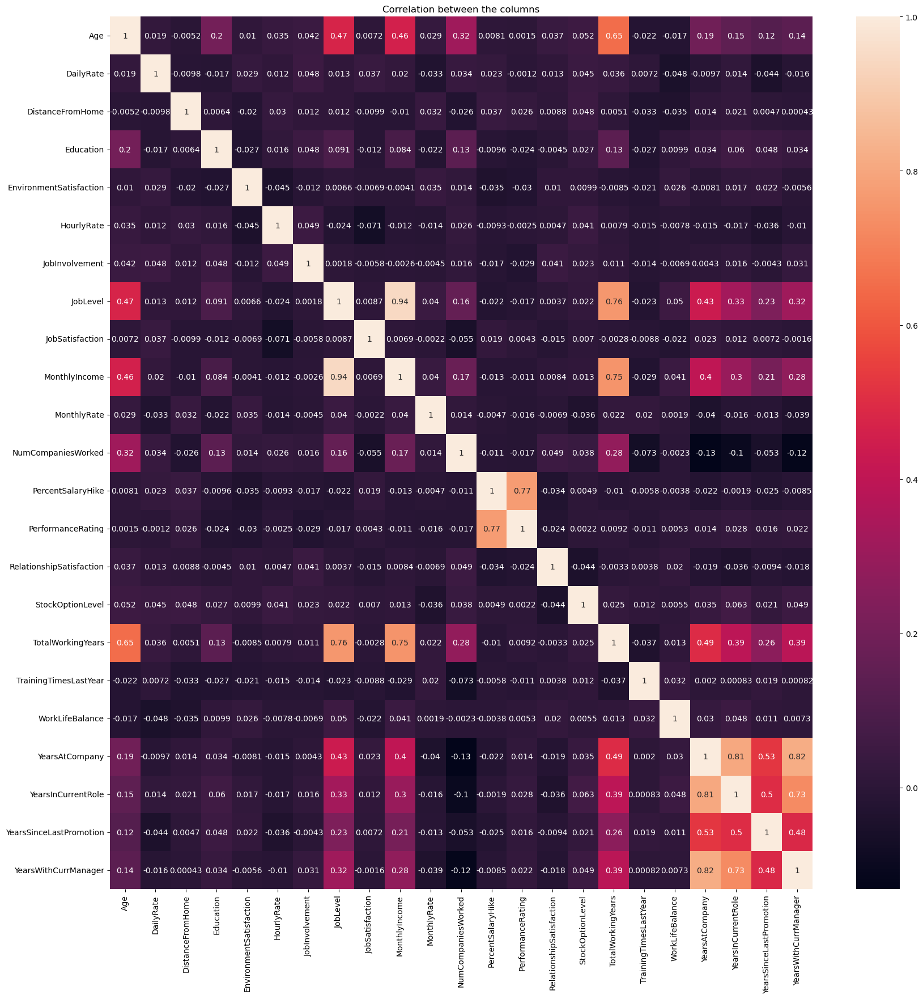

In [62]:
plt.figure(figsize=(20,20))
sns.heatmap(hr_cor, annot = True)
plt.title("Correlation between the columns")
plt.show()

-- There are signs of multicollinearity present in the dataset.

We will be removing the column 'PercentSalaryHike' as it is multicollinear and this particular feature does not have much effect on the prediction process.

We will also be removing the column 'YearsInCurrentRole' and 'Job Level' as it is also multicollinear and this particular feature does not have much effect on the prediction process and also very less info about these features.

We will be removing the column 'Years with Current Manager' as we know very less info about this feature.

In [63]:
hr_1.drop(['PercentSalaryHike'],axis=1,inplace=True)

In [64]:
hr_1.drop(['YearsInCurrentRole'],axis=1,inplace=True)

In [66]:
hr_1.drop(['JobLevel'],axis=1,inplace=True)

In [68]:
hr_1.drop(['YearsWithCurrManager'],axis=1,inplace=True)

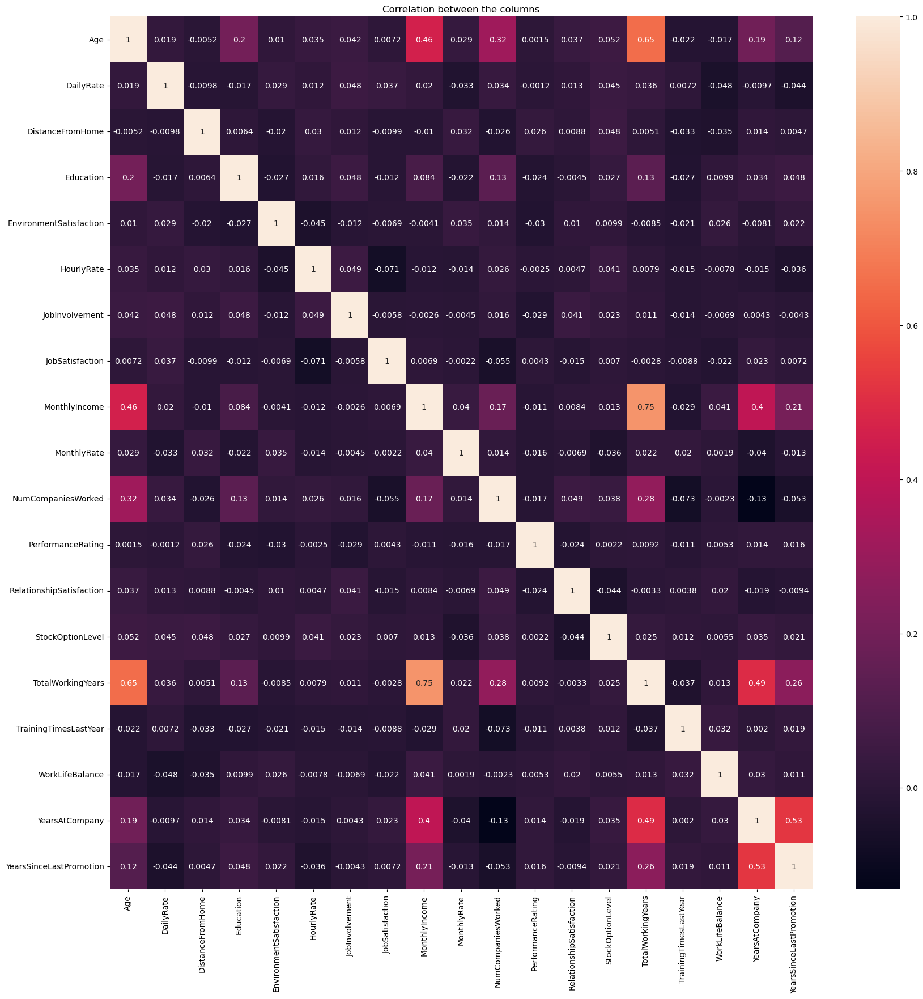

In [69]:
#Again Checking for correlation
hr_cor = hr_1.corr()
plt.figure(figsize=(20,20))
sns.heatmap(hr_cor, annot = True)
plt.title("Correlation between the columns")
plt.show()

-- Removed Multicollinearity in the dataset successfully..

In [70]:
#Checking Skewness of data
hr_1.skew()

Age                         0.464944
DailyRate                  -0.013323
DistanceFromHome            0.952643
Education                  -0.284108
EnvironmentSatisfaction    -0.317401
HourlyRate                 -0.035354
JobInvolvement             -0.507594
JobSatisfaction            -0.342754
MonthlyIncome               1.504012
MonthlyRate                 0.026320
NumCompaniesWorked          1.027023
PerformanceRating           1.922025
RelationshipSatisfaction   -0.288288
StockOptionLevel            0.961437
TotalWorkingYears           1.128511
TrainingTimesLastYear       0.571263
WorkLifeBalance            -0.555827
YearsAtCompany              1.246341
YearsSinceLastPromotion     1.729272
dtype: float64

-- No skewness in the dataset.

## Data PreProcessing 

-- Label Encoding the categorical columns

In [71]:
hr_1

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsSinceLastPromotion
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,Sales Executive,4,Single,5993,19479,8,Yes,3,1,0,8,0,1,6,0
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,Research Scientist,2,Married,5130,24907,1,No,4,4,1,10,3,3,10,1
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,Laboratory Technician,3,Single,2090,2396,6,Yes,3,2,0,7,3,3,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,Research Scientist,3,Married,2909,23159,1,Yes,3,3,0,8,3,3,8,3
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,Laboratory Technician,2,Married,3468,16632,9,No,3,4,1,6,3,3,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,41,4,Laboratory Technician,4,Married,2571,12290,4,No,3,3,1,17,3,3,5,0
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,42,2,Healthcare Representative,1,Married,9991,21457,4,No,3,1,1,9,5,3,7,1
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,87,4,Manufacturing Director,2,Married,6142,5174,1,Yes,4,2,1,6,0,3,6,0
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,63,2,Sales Executive,2,Married,5390,13243,2,No,3,4,0,17,3,2,9,0


In [72]:
cat_col = []
for i in hr_1.dtypes.index:
    if hr_1.dtypes[i] == "object":
        cat_col.append(i)
print("Categorical Variables: ",cat_col)

Categorical Variables:  ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']


In [73]:
for i in cat_col:
    print(f"Categories in {i} variable: ",end=" ")
    print(hr_1[i].unique())

Categories in Attrition variable:  ['Yes' 'No']
Categories in BusinessTravel variable:  ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Categories in Department variable:  ['Sales' 'Research & Development' 'Human Resources']
Categories in EducationField variable:  ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
Categories in Gender variable:  ['Female' 'Male']
Categories in JobRole variable:  ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
Categories in MaritalStatus variable:  ['Single' 'Married' 'Divorced']
Categories in OverTime variable:  ['Yes' 'No']


In [74]:
bool_columns = ['Attrition','OverTime']
for i in bool_columns:
    hr_1[i+'_new'] = hr_1[i].apply(lambda x : 1 if x == 'Yes' else 0)
    hr_1.drop(i,axis=1,inplace=True)

In [75]:
bool_col = ['Gender']
for i in bool_col:
    hr_1[i+'_new'] = hr_1[i].apply(lambda x : 1 if x == 'Male' else 0)
    hr_1.drop(i,axis=1,inplace=True)

In [76]:
hr_1

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsSinceLastPromotion,Attrition_new,OverTime_new,Gender_new
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,94,3,Sales Executive,4,Single,5993,19479,8,3,1,0,8,0,1,6,0,1,1,0
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,61,2,Research Scientist,2,Married,5130,24907,1,4,4,1,10,3,3,10,1,0,0,1
2,37,Travel_Rarely,1373,Research & Development,2,2,Other,4,92,2,Laboratory Technician,3,Single,2090,2396,6,3,2,0,7,3,3,0,0,1,1,1
3,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,56,3,Research Scientist,3,Married,2909,23159,1,3,3,0,8,3,3,8,3,0,1,0
4,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,40,3,Laboratory Technician,2,Married,3468,16632,9,3,4,1,6,3,3,2,2,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,Travel_Frequently,884,Research & Development,23,2,Medical,3,41,4,Laboratory Technician,4,Married,2571,12290,4,3,3,1,17,3,3,5,0,0,0,1
1466,39,Travel_Rarely,613,Research & Development,6,1,Medical,4,42,2,Healthcare Representative,1,Married,9991,21457,4,3,1,1,9,5,3,7,1,0,0,1
1467,27,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,87,4,Manufacturing Director,2,Married,6142,5174,1,4,2,1,6,0,3,6,0,0,1,1
1468,49,Travel_Frequently,1023,Sales,2,3,Medical,4,63,2,Sales Executive,2,Married,5390,13243,2,3,4,0,17,3,2,9,0,0,0,1


In [77]:
cat_col = ['BusinessTravel','Department','EducationField','JobRole','MaritalStatus']
hr_encoded = pd.get_dummies(hr_1,columns=cat_col)
print(hr_encoded)

      Age  DailyRate  DistanceFromHome  Education  EnvironmentSatisfaction  \
0      41       1102                 1          2                        2   
1      49        279                 8          1                        3   
2      37       1373                 2          2                        4   
3      33       1392                 3          4                        4   
4      27        591                 2          1                        1   
...   ...        ...               ...        ...                      ...   
1465   36        884                23          2                        3   
1466   39        613                 6          1                        4   
1467   27        155                 4          3                        2   
1468   49       1023                 2          3                        4   
1469   34        628                 8          3                        2   

      HourlyRate  JobInvolvement  JobSatisfaction  MonthlyIncom

In [78]:
#Encoded all the categorical variables
hr_encoded

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsSinceLastPromotion,Attrition_new,OverTime_new,Gender_new,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,41,1102,1,2,2,94,3,4,5993,19479,8,3,1,0,8,0,1,6,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,49,279,8,1,3,61,2,2,5130,24907,1,4,4,1,10,3,3,10,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,37,1373,2,2,4,92,2,3,2090,2396,6,3,2,0,7,3,3,0,0,1,1,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
3,33,1392,3,4,4,56,3,3,2909,23159,1,3,3,0,8,3,3,8,3,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,27,591,2,1,1,40,3,2,3468,16632,9,3,4,1,6,3,3,2,2,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,3,41,4,4,2571,12290,4,3,3,1,17,3,3,5,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1466,39,613,6,1,4,42,2,1,9991,21457,4,3,1,1,9,5,3,7,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0
1467,27,155,4,3,2,87,4,2,6142,5174,1,4,2,1,6,0,3,6,0,0,1,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1468,49,1023,2,3,4,63,2,2,5390,13243,2,3,4,0,17,3,2,9,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0


-- Encoded all the categorical columns successfully.

In [79]:
hr_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1405 entries, 0 to 1469
Data columns (total 46 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   Age                                1405 non-null   int64
 1   DailyRate                          1405 non-null   int64
 2   DistanceFromHome                   1405 non-null   int64
 3   Education                          1405 non-null   int64
 4   EnvironmentSatisfaction            1405 non-null   int64
 5   HourlyRate                         1405 non-null   int64
 6   JobInvolvement                     1405 non-null   int64
 7   JobSatisfaction                    1405 non-null   int64
 8   MonthlyIncome                      1405 non-null   int64
 9   MonthlyRate                        1405 non-null   int64
 10  NumCompaniesWorked                 1405 non-null   int64
 11  PerformanceRating                  1405 non-null   int64
 12  RelationshipSatisfac

In [80]:
#Splitting the dataframe into feature and target variables
hr_encoded

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsSinceLastPromotion,Attrition_new,OverTime_new,Gender_new,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,41,1102,1,2,2,94,3,4,5993,19479,8,3,1,0,8,0,1,6,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,49,279,8,1,3,61,2,2,5130,24907,1,4,4,1,10,3,3,10,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,37,1373,2,2,4,92,2,3,2090,2396,6,3,2,0,7,3,3,0,0,1,1,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
3,33,1392,3,4,4,56,3,3,2909,23159,1,3,3,0,8,3,3,8,3,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,27,591,2,1,1,40,3,2,3468,16632,9,3,4,1,6,3,3,2,2,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,3,41,4,4,2571,12290,4,3,3,1,17,3,3,5,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1466,39,613,6,1,4,42,2,1,9991,21457,4,3,1,1,9,5,3,7,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0
1467,27,155,4,3,2,87,4,2,6142,5174,1,4,2,1,6,0,3,6,0,0,1,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1468,49,1023,2,3,4,63,2,2,5390,13243,2,3,4,0,17,3,2,9,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0


In [81]:
#Target Variable
y = hr_encoded['Attrition_new']
y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition_new, Length: 1405, dtype: int64

In [82]:
#Independent variables
x = hr_encoded.drop("Attrition_new",axis=1)
x

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsSinceLastPromotion,OverTime_new,Gender_new,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,41,1102,1,2,2,94,3,4,5993,19479,8,3,1,0,8,0,1,6,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,49,279,8,1,3,61,2,2,5130,24907,1,4,4,1,10,3,3,10,1,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,37,1373,2,2,4,92,2,3,2090,2396,6,3,2,0,7,3,3,0,0,1,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
3,33,1392,3,4,4,56,3,3,2909,23159,1,3,3,0,8,3,3,8,3,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,27,591,2,1,1,40,3,2,3468,16632,9,3,4,1,6,3,3,2,2,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,3,41,4,4,2571,12290,4,3,3,1,17,3,3,5,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1466,39,613,6,1,4,42,2,1,9991,21457,4,3,1,1,9,5,3,7,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0
1467,27,155,4,3,2,87,4,2,6142,5174,1,4,2,1,6,0,3,6,0,1,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1468,49,1023,2,3,4,63,2,2,5390,13243,2,3,4,0,17,3,2,9,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0


In [83]:
y.value_counts()

0    1176
1     229
Name: Attrition_new, dtype: int64

-- As there is a huge difference in the target variable, we shall be performing some oversampling technique (SMOTE) to make the data balanced.

In [84]:
#Standardizing data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = pd.DataFrame(sc.fit_transform(x))

In [85]:
X

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44
0,0.511173,0.736442,-1.012073,-0.878419,-0.659275,1.380450,0.372417,1.146188,-0.033658,0.731715,2.118450,-0.426222,-1.569699,-0.930292,-0.362071,-2.167137,-2.508647,-0.042900,-0.714330,1.593437,-1.222931,-0.337928,-0.483258,0.641919,-0.21121,-1.372957,1.513406,-0.137311,1.194403,-0.345719,-0.678601,-0.244085,-0.316599,-0.308366,-0.196044,-0.469763,-0.237468,-0.332674,-0.228986,-0.511098,1.848848,-0.250567,-0.529873,-0.921241,1.452035
1,1.406124,-1.302298,-0.146756,-1.854055,0.256023,-0.245393,-1.030386,-0.671413,-0.231314,1.499430,-0.678939,2.346195,1.200938,0.237769,-0.077796,0.153026,0.334958,0.794247,-0.319665,-0.627574,0.817708,-0.337928,2.069288,-1.557828,-0.21121,0.728355,-0.660761,-0.137311,1.194403,-0.345719,-0.678601,-0.244085,-0.316599,-0.308366,-0.196044,-0.469763,-0.237468,-0.332674,-0.228986,1.956573,-0.540877,-0.250567,-0.529873,1.085493,-0.688688
2,0.063698,1.407765,-0.888456,-0.878419,1.171320,1.281914,-1.030386,0.237388,-0.927575,-1.684438,1.319196,-0.426222,-0.646153,-0.930292,-0.504208,0.153026,0.334958,-1.298620,-0.714330,1.593437,0.817708,-0.337928,-0.483258,0.641919,-0.21121,0.728355,-0.660761,-0.137311,-0.837239,-0.345719,-0.678601,4.096927,-0.316599,-0.308366,-0.196044,2.128731,-0.237468,-0.332674,-0.228986,-0.511098,-0.540877,-0.250567,-0.529873,-0.921241,1.452035
3,-0.383778,1.454832,-0.764840,1.072852,1.171320,-0.491733,0.372417,0.237388,-0.739997,1.252200,-0.678939,-0.426222,0.277392,-0.930292,-0.362071,0.153026,0.334958,0.375673,0.469665,1.593437,-1.222931,-0.337928,2.069288,-1.557828,-0.21121,0.728355,-0.660761,-0.137311,1.194403,-0.345719,-0.678601,-0.244085,-0.316599,-0.308366,-0.196044,-0.469763,-0.237468,-0.332674,-0.228986,1.956573,-0.540877,-0.250567,-0.529873,1.085493,-0.688688
4,-1.054991,-0.529410,-0.888456,-1.854055,-1.574572,-1.280021,0.372417,-0.671413,-0.611967,0.329046,2.518077,-0.426222,1.200938,0.237769,-0.646345,0.153026,0.334958,-0.880047,0.075000,-0.627574,0.817708,-0.337928,-0.483258,0.641919,-0.21121,0.728355,-0.660761,-0.137311,-0.837239,-0.345719,1.473621,-0.244085,-0.316599,-0.308366,-0.196044,2.128731,-0.237468,-0.332674,-0.228986,-0.511098,-0.540877,-0.250567,-0.529873,1.085493,-0.688688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1400,-0.048171,0.196412,1.707494,-0.878419,0.256023,-1.230753,1.775219,1.146188,-0.817410,-0.285069,0.519942,-0.426222,0.277392,0.237769,0.917165,0.153026,0.334958,-0.252187,-0.714330,-0.627574,0.817708,-0.337928,2.069288,-1.557828,-0.21121,0.728355,-0.660761,-0.137311,-0.837239,-0.345719,1.473621,-0.244085,-0.316599,-0.308366,-0.196044,2.128731,-0.237468,-0.332674,-0.228986,-0.511098,-0.540877,-0.250567,-0.529873,1.085493,-0.688688
1401,0.287435,-0.474911,-0.393990,-1.854055,1.171320,-1.181485,-1.030386,-1.580214,0.882017,1.011475,0.519942,-0.426222,-1.569699,0.237769,-0.219933,1.699802,0.334958,0.166387,-0.319665,-0.627574,0.817708,-0.337928,-0.483258,0.641919,-0.21121,0.728355,-0.660761,-0.137311,-0.837239,-0.345719,1.473621,-0.244085,-0.316599,3.242899,-0.196044,-0.469763,-0.237468,-0.332674,-0.228986,-0.511098,-0.540877,-0.250567,-0.529873,1.085493,-0.688688
1402,-1.054991,-1.609471,-0.641223,0.097216,-0.659275,1.035574,1.775219,-0.671413,0.000468,-1.291529,-0.678939,2.346195,-0.646153,0.237769,-0.646345,-2.167137,0.334958,-0.042900,-0.714330,1.593437,0.817708,-0.337928,-0.483258,0.641919,-0.21121,0.728355,-0.660761,-0.137311,1.194403,-0.345719,-0.678601,-0.244085,-0.316599,-0.308366,-0.196044,-0.469763,-0.237468,3.005946,-0.228986,-0.511098,-0.540877,-0.250567,-0.529873,1.085493,-0.688688
1403,1.406124,0.540743,-0.888456,0.097216,1.171320,-0.146857,-1.030386,-0.671413,-0.171765,-0.150281,-0.279312,-0.426222,1.200938,-0.930292,0.917165,0.153026,-1.086844,0.584960,-0.714330,-0.627

In [86]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
X1,y1 = sm.fit_resample(X,y)

In [87]:
y1.value_counts()

1    1176
0    1176
Name: Attrition_new, dtype: int64

In [90]:
# Now, Splitting the data into training and test dataset
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X1,y1,test_size = 0.20)

In [91]:
print("X_train ",X_train.shape)
print("y_train ",y_train.shape)
print("X_test ",X_test.shape)
print("y_test ",y_test.shape)

X_train  (1881, 45)
y_train  (1881,)
X_test  (471, 45)
y_test  (471,)


## Model Training 

#### Logistic Regression 

In [92]:
#importing necessary libraries
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [93]:
logreg = LogisticRegression()
logreg.fit(X_train,y_train)
logreg_pred = logreg.predict(X_test)
logreg_acc = accuracy_score(y_test,logreg_pred)
print('Test accuracy is: {:.2f}%'.format(logreg_acc*100))

Test accuracy is: 80.47%


In [94]:
print(classification_report(y_test,logreg_pred))

              precision    recall  f1-score   support

           0       0.83      0.79      0.81       245
           1       0.78      0.82      0.80       226

    accuracy                           0.80       471
   macro avg       0.80      0.81      0.80       471
weighted avg       0.81      0.80      0.80       471



In [95]:
a = confusion_matrix(y_test, logreg_pred, labels=logreg.classes_)
print(a)
print("TN: ",a[0][0])
print("FN: ",a[1][0])
print("TP: ",a[1][1])
print("FP: ",a[0][1])

[[194  51]
 [ 41 185]]
TN:  194
FN:  41
TP:  185
FP:  51


#### Decision Tree Classifier 

In [96]:
#importing necessary libraries
from sklearn.tree import DecisionTreeClassifier

In [97]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
dtree_pred = dtree.predict(X_test)
dtree_acc = accuracy_score(dtree_pred,y_test)
print('Test accuracy is: {:.2f}%'.format(dtree_acc*100))

Test accuracy is: 81.53%


In [98]:
print(classification_report(y_test,dtree_pred))

              precision    recall  f1-score   support

           0       0.83      0.80      0.82       245
           1       0.80      0.83      0.81       226

    accuracy                           0.82       471
   macro avg       0.82      0.82      0.82       471
weighted avg       0.82      0.82      0.82       471



In [99]:
a = confusion_matrix(y_test, dtree_pred, labels=dtree.classes_)
print(a)
print("TN: ",a[0][0])
print("FN: ",a[1][0])
print("TP: ",a[1][1])
print("FP: ",a[0][1])

[[197  48]
 [ 39 187]]
TN:  197
FN:  39
TP:  187
FP:  48


#### Random Forest Classifier

In [100]:
#importing necessary libraries
from sklearn.ensemble import RandomForestClassifier

In [101]:
r_f = RandomForestClassifier()
r_f.fit(X_train,y_train)
r_f_pred = r_f.predict(X_test)
r_f_acc = accuracy_score(r_f_pred,y_test)
print('Test accuracy is: {:.2f}%'.format(r_f_acc*100))

Test accuracy is: 93.63%


In [102]:
print(classification_report(y_test,r_f_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94       245
           1       0.98      0.88      0.93       226

    accuracy                           0.94       471
   macro avg       0.94      0.93      0.94       471
weighted avg       0.94      0.94      0.94       471



In [103]:
a = confusion_matrix(y_test, r_f_pred, labels=r_f.classes_)
print(a)
print("TN: ",a[0][0])
print("FN: ",a[1][0])
print("TP: ",a[1][1])
print("FP: ",a[0][1])

[[241   4]
 [ 26 200]]
TN:  241
FN:  26
TP:  200
FP:  4


#### Naive Bayes Classifier 

In [104]:
from sklearn.naive_bayes import GaussianNB

In [105]:
nb = GaussianNB()
nb.fit(X_train,y_train)
nb_pred = nb.predict(X_test)
nb_acc = accuracy_score(nb_pred,y_test)
print('Test accuracy is: {:.2f}%'.format(nb_acc*100))

Test accuracy is: 62.21%


In [106]:
print(classification_report(y_test,nb_pred))

              precision    recall  f1-score   support

           0       0.88      0.32      0.47       245
           1       0.56      0.95      0.71       226

    accuracy                           0.62       471
   macro avg       0.72      0.63      0.59       471
weighted avg       0.73      0.62      0.58       471



In [107]:
a = confusion_matrix(y_test, nb_pred, labels=nb.classes_)
print(a)
print("TN: ",a[0][0])
print("FN: ",a[1][0])
print("TP: ",a[1][1])
print("FP: ",a[0][1])

[[ 78 167]
 [ 11 215]]
TN:  78
FN:  11
TP:  215
FP:  167


#### Support Vector Classifier 

In [108]:
from sklearn.svm import SVC

In [109]:
svc = SVC()
svc.fit(X_train,y_train)
svc_pred = svc.predict(X_test)
svc_acc = accuracy_score(svc_pred,y_test)
print('Test accuracy is: {:.2f}%'.format(svc_acc*100))

Test accuracy is: 93.63%


In [110]:
print(classification_report(y_test,svc_pred))

              precision    recall  f1-score   support

           0       0.97      0.91      0.94       245
           1       0.91      0.96      0.94       226

    accuracy                           0.94       471
   macro avg       0.94      0.94      0.94       471
weighted avg       0.94      0.94      0.94       471



In [111]:
a = confusion_matrix(y_test, svc_pred, labels=svc.classes_)
print(a)
print("TN: ",a[0][0])
print("FN: ",a[1][0])
print("TP: ",a[1][1])
print("FP: ",a[0][1])

[[223  22]
 [  8 218]]
TN:  223
FN:  8
TP:  218
FP:  22


#### K-neighbor Classifier 

In [112]:
from sklearn.neighbors import KNeighborsClassifier

In [113]:
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)
knn_pred = knn.predict(X_test)
knn_acc = accuracy_score(knn_pred,y_test)
print('Test accuracy is: {:.2f}%'.format(knn_acc*100))

Test accuracy is: 80.47%


In [114]:
print(classification_report(y_test,knn_pred))

              precision    recall  f1-score   support

           0       0.98      0.64      0.77       245
           1       0.71      0.99      0.83       226

    accuracy                           0.80       471
   macro avg       0.85      0.81      0.80       471
weighted avg       0.85      0.80      0.80       471



In [115]:
a = confusion_matrix(y_test, knn_pred, labels=knn.classes_)
print(a)
print("TN: ",a[0][0])
print("FN: ",a[1][0])
print("TP: ",a[1][1])
print("FP: ",a[0][1])

[[156  89]
 [  3 223]]
TN:  156
FN:  3
TP:  223
FP:  89


### Cross-Validation Techniques

In [116]:
from sklearn.model_selection import cross_val_score

In [117]:
#Random Forest Classifier
score = cross_val_score(r_f,X1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,r_f_pred) - score.mean())

[0.76008493 0.97452229 0.9787234  0.98085106 0.98723404]
0.93628314586439
Difference between Accuracy score and cross validation score is -  2.258661968645992e-05


In [118]:
#Support Vector Classifier 
score = cross_val_score(svc,X1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,svc_pred) - score.mean())

[0.91507431 0.94055202 0.93829787 0.92553191 0.93617021]
0.9311252653927813
Difference between Accuracy score and cross validation score is -  0.00518046709129516


-- Conclusion:

From the model training and the cross val scores (of the top two models) done in the previous section, I am going to choose Support Vector Classifier (SVC) as my final model for the prediction of Attrition rate of a company.

(?) - The reason I chose SVC as my final model, is because of it's really good performance with the classification of values.
The accuracy score of the model is the highest of all the classification models tested which is (93.63%) and from the classification report, we see that the precision, recall and f1 scores are well balanced and have a really good scores individually too..As the metric recall or TPR(measure of how accurately our model is able to identify the relevent data) is important for our data, as the HR needs an accurate data for the attrition rate of the company and needs to take relevent steps to retain their employees. And from the confusion matrix, we see that the ratio of TP and TN is really good as compared to other models, and the number of FN or Type 2 error is more as compared to Random Forest Classifier (which has the same accuracy score as SVC).

Finally, from the cross val scores of the top 2 models (i.e Random Forest Classifier and SVC) SVC has equal accuracy scores across the five folds whereas RFC does not have equal scores.

Therefore, SVC is our best and final Model.

### Plotting AUC-ROC curve  

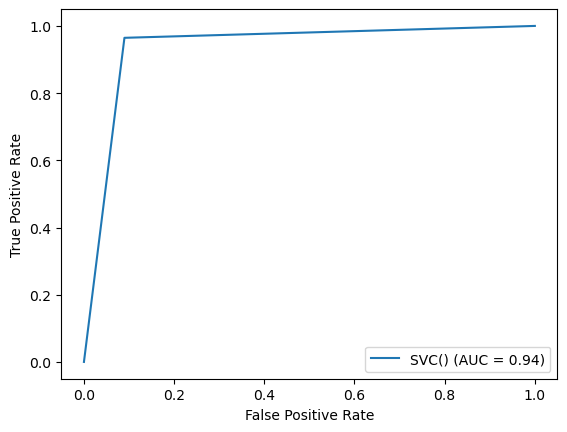

In [119]:
from sklearn import metrics
fpr,tpr,thresholds = metrics.roc_curve(y_test,svc_pred)
roc_auc = metrics.auc(fpr,tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=svc)
display.plot()

#### Hyperparameter Tuning 

In [123]:
from sklearn.model_selection import RandomizedSearchCV
param_dist = {'C':[0.1,1,10,100,1000],'gamma':[1,0.1,0.01,0.001,0.0001]}
svc = SVC()
random_search = RandomizedSearchCV(svc,param_distributions=param_dist,scoring='accuracy')
random_search.fit(X_train,y_train)

RandomizedSearchCV(estimator=SVC(),
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
                   scoring='accuracy')

In [125]:
random_search.best_params_

{'gamma': 0.1, 'C': 1}

In [124]:
random_search.best_score_

0.9760694734465828

In [126]:
Final_model = SVC(gamma = 0.1,C = 1)
Final_model.fit(X_train,y_train)
fm_pred = Final_model.predict(X_test)
fm_acc = accuracy_score(fm_pred,y_test)
print('Test accuracy is: {:.2f}%'.format(fm_acc*100))

Test accuracy is: 98.94%


In [128]:
print(classification_report(y_test,fm_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       245
           1       1.00      0.98      0.99       226

    accuracy                           0.99       471
   macro avg       0.99      0.99      0.99       471
weighted avg       0.99      0.99      0.99       471



In [130]:
a = confusion_matrix(y_test, fm_pred, labels=Final_model.classes_)
print(a)
print("TN: ",a[0][0])
print("FN: ",a[1][0])
print("TP: ",a[1][1])
print("FP: ",a[0][1])

[[245   0]
 [  5 221]]
TN:  245
FN:  5
TP:  221
FP:  0


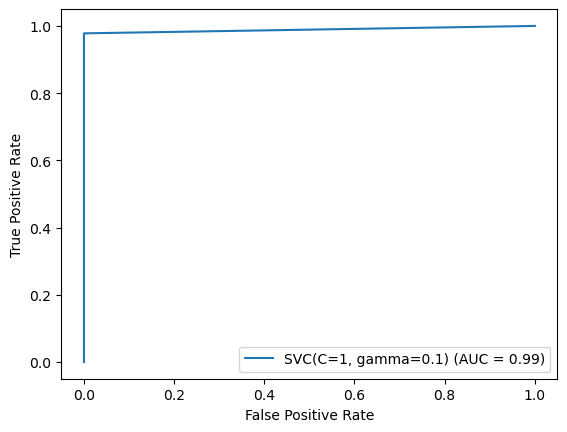

In [127]:
#Plotting AUC-ROC curve for final model
from sklearn import metrics
fpr,tpr,thresholds = metrics.roc_curve(y_test,fm_pred)
roc_auc = metrics.auc(fpr,tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=Final_model)
display.plot()

## Saving the Model 

In [131]:
import joblib
joblib.dump(Final_model,"HR_Analytics_Project.pkl")

['HR_Analytics_Project.pkl']

In [132]:
model = joblib.load("HR_Analytics_Project.pkl")
prediction = model.predict(X_test)
prediction

array([0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,

In [134]:
b

array([0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,

In [133]:
b = np.array(y_test)
df = pd.DataFrame()
df['Predicted'] = prediction
df['Original'] = b
df

,Predicted,Original
0,0,0
1,1,1
2,0,0
3,1,1
4,0,0
...,...,...
466,0,0
467,1,1
468,1,1
469,0,0
